# Analyse exploratoire

In [1]:
#!pip install missingno plotly

In [2]:
#import des modules necessaires
import os
import time
import datetime as dt
import requests
import shutil
import math

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from sklearn.metrics import mean_squared_error 
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

import missingno as msno


In [3]:
fichierDist='https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P4/2016_Building_Energy_Benchmarking.csv'
dossierData='Datas'
dossierExport=dossierData+'/'
fichierLocl=dossierExport+'2016_Building_Energy_Benchmarking.csv'

In [4]:
# Création du dossier export
def CreationDir(dossierExport):
    if not os.path.exists(dossierExport):
        os.makedirs(dossierExport)

In [5]:
def delFeature(df,Feat2del=0):
    """Efface les features qui n'ont qu'une seule valeur"""
    if Feat2del == 0 :
        tmp = df.nunique()
        cols=tmp[tmp==1].index
        df.drop(columns=cols, inplace=True)
        colonnes = [col for col in cols]
        print('Liste des colonnes inutiles supprimées :',colonnes)
    else:
        for feat in Feat2del:
            if (feat in df.columns):
                df.drop(columns=feat, inplace=True)
            else:
                print('colonne',feat,'inexistante !')
        print('Liste des colonnes supprimées :',Feat2del)


In [6]:
def delIndividus(Datas,Indexes):
    """
    # Purge d'individus 
    # Liste des paramètres :
    #  - Data       : nom du dataframe a modifier
    #  - Indexes    : indexes a purger [liste des indexes]
    """
    print('------------------ Purge des individus ------------------')
    if len(Indexes) > 0:
            #récupération du nom du dataframe
            nomData = [name for name in globals() if globals()[name] is Datas]
            nomDf = ''.join(nomData)
            print('\n-- suppression de ',len(Indexes),' indexes du DataFrame ',nomDf)
            Datas.drop(Indexes, inplace=True)
    else:
            print('aucun index a supprimer !')

In [7]:
# on cree le repertoire Data si il n'existe pas
CreationDir(dossierExport)

# on recupere le fichier d'origine
if not os.path.exists(fichierLocl):
    response = requests.get(fichierDist)
    if response.status_code == 200:
        with open(fichierLocl, "wb") as file:
            file.write(response.content)
            print("Fichier téléchargé avec succès!")
    else:
        print("Erreur de téléchargement du fichier!")
else:
    print("Fichier déjà existant")


Fichier déjà existant


In [8]:
# Chargement des données
dfDataInput = pd.read_csv(fichierLocl, sep=',', lineterminator='\n')

## Exploration des données

### Echantillon de données

In [9]:
dfDataInput.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


### Taille du dataframe

In [10]:
dfDataInput.shape

(3376, 46)

> 3376 individus pour 46 variables

### Pourcentage de valeurs nulles dans le dataframe

In [11]:
print(round((dfDataInput.isna().sum().sum()/dfDataInput.size*100),2),"%")

12.85 %


### Types et valeurs non nulles des variables

In [12]:
dfDataInput.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

### Valeurs uniques des variables

In [13]:
dfDataInput.nunique()

OSEBuildingID                      3376
DataYear                              1
BuildingType                          8
PrimaryPropertyType                  24
PropertyName                       3362
Address                            3354
City                                  1
State                                 1
ZipCode                              55
TaxParcelIdentificationNumber      3268
CouncilDistrictCode                   7
Neighborhood                         19
Latitude                           2876
Longitude                          2656
YearBuilt                           113
NumberofBuildings                    17
NumberofFloors                       50
PropertyGFATotal                   3195
PropertyGFAParking                  496
PropertyGFABuilding(s)             3193
ListOfAllPropertyUseTypes           466
LargestPropertyUseType               56
LargestPropertyUseTypeGFA          3122
SecondLargestPropertyUseType         50
SecondLargestPropertyUseTypeGFA    1352


### Statistiques des variables quantitatives

In [14]:
dfDataInput.describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,...,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,3376.000000,3376.0,3360.000000,3376.000000,3376.000000,3376.000000,3376.000000,3368.000000,3376.000000,3.376000e+03,...,3.371000e+03,3.370000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,0.0,3367.000000,3367.000000
mean,21208.991114,2016.0,98116.949107,4.439277,47.624033,-122.334795,1968.573164,1.106888,4.709123,9.483354e+04,...,5.403667e+06,5.276726e+06,2.745959e+05,1.086639e+06,3.707612e+06,1.368505e+04,1.368505e+06,NaN,119.723971,1.175916
std,12223.757015,0.0,18.615205,2.120625,0.047758,0.027203,33.088156,2.108402,5.494465,2.188376e+05,...,2.161063e+07,1.593879e+07,3.912173e+06,4.352478e+06,1.485066e+07,6.709781e+04,6.709781e+06,NaN,538.832227,1.821452
min,1.000000,2016.0,98006.000000,1.000000,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,NaN,-0.800000,-0.020000
25%,19990.750000,2016.0,98105.000000,3.000000,47.599860,-122.350662,1948.000000,1.000000,2.000000,2.848700e+04,...,9.251286e+05,9.701822e+05,0.000000e+00,1.874229e+05,6.394870e+05,0.000000e+00,0.000000e+00,NaN,9.495000,0.210000
50%,23112.000000,2016.0,98115.000000,4.000000,47.618675,-122.332495,1975.000000,1.000000,4.000000,4.417500e+04,...,1.803753e+06,1.904452e+06,0.000000e+00,3.451299e+05,1.177583e+06,3.237538e+03,3.237540e+05,NaN,33.920000,0.610000
75%,25994.250000,2016.0,98122.000000,7.000000,47.657115,-122.319407,1997.000000,1.000000,5.000000,9.099200e+04,...,4.222455e+06,4.381429e+06,0.000000e+00,8.293178e+05,2.829632e+06,1.189033e+04,1.189034e+06,NaN,93.940000,1.370000
max,50226.000000,2016.0,98272.000000,7.000000,47.733870,-122.220966,2015.000000,111.000000,99.000000,9.320156e+06,...,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,NaN,16870.980000,34.090000


### Statistiques des variables qualitatives

In [15]:
dfDataInput.select_dtypes(['object']).describe() # pour les variables qualitatives

,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,YearsENERGYSTARCertified,ComplianceStatus,Outlier
count,3376,3376,3376,3376,3376,3376,3376,3376,3367,3356,1679,596,119,3376,32
unique,8,24,3362,3354,1,1,3268,19,466,56,50,44,65,4,2
top,NonResidential,Low-Rise Multifamily,Northgate Plaza,2600 SW Barton St,Seattle,WA,1625049001,DOWNTOWN,Multifamily Housing,Multifamily Housing,Parking,Retail Store,2016,Compliant,Low outlier
freq,1460,987,3,4,3376,3376,8,573,866,1667,976,110,14,3211,23


## Nettoyage des données

### Verification des doublons
sur l'id du batiment

In [16]:
Data=dfDataInput.copy()
DoublonCle='OSEBuildingID'
if Data.duplicated(subset=DoublonCle).any() == True:
    print('-- présence de doublons dans la feature \''+DoublonCle+'\'') 
    Result=pd.concat(g for _, g in Data.groupby(DoublonCle) if len(g) > 1)
    nb_doublon=Result.shape[0]
    nb_enr_total=Data.shape[0]
    prct_doublon=round((nb_doublon*100)/nb_enr_total,3)
    print('   nombre doublons :',nb_doublon)
    print('   pourcentage doublons :',prct_doublon,'%')
else:
    print('-- pas de doublon dans la feature \''+DoublonCle+'\'')

-- pas de doublon dans la feature 'OSEBuildingID'


### completion des ZipCodes manquants

In [17]:
dfTemp=dfDataInput[['ZipCode','Latitude','Longitude']]
dfTemp

,ZipCode,Latitude,Longitude
0,98101.0,47.61220,-122.33799
1,98101.0,47.61317,-122.33393
2,98101.0,47.61393,-122.33810
3,98101.0,47.61412,-122.33664
4,98121.0,47.61375,-122.34047
...,...,...,...
3371,NaN,47.56722,-122.31154
3372,NaN,47.59625,-122.32283
3373,NaN,47.63644,-122.35784
3374,NaN,47.52832,-122.32431


In [18]:
dfTemp.ZipCode = pd.to_numeric(dfTemp.ZipCode, errors='coerce').fillna(0).astype(np.int64)
dfTemp

/tmp/ipykernel_33996/3585532413.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfTemp.ZipCode = pd.to_numeric(dfTemp.ZipCode, errors='coerce').fillna(0).astype(np.int64)


,ZipCode,Latitude,Longitude
0,98101,47.61220,-122.33799
1,98101,47.61317,-122.33393
2,98101,47.61393,-122.33810
3,98101,47.61412,-122.33664
4,98121,47.61375,-122.34047
...,...,...,...
3371,0,47.56722,-122.31154
3372,0,47.59625,-122.32283
3373,0,47.63644,-122.35784
3374,0,47.52832,-122.32431


In [19]:
X_train=dfTemp.loc[(~dfTemp['ZipCode'].isna())]
X=dfTemp

In [20]:
import sklearn.impute
imputer = sklearn.impute.KNNImputer(missing_values=0,n_neighbors=3, weights='uniform', metric='nan_euclidean')
imputer.fit(X_train)

start = time.time()
dfImputer_transorm = imputer.transform(X)
print('Temps d\'execution :',round(time.time() - start,1),' s')
dfZipCode=pd.DataFrame(dfImputer_transorm, columns=X.columns, index=X.index)
dfZipCode.ZipCode = pd.to_numeric(dfZipCode.ZipCode, errors='coerce').astype(np.int64)

dfZipCode

Temps d'execution : 0.0  s


,ZipCode,Latitude,Longitude
0,98101,47.61220,-122.33799
1,98101,47.61317,-122.33393
2,98101,47.61393,-122.33810
3,98101,47.61412,-122.33664
4,98121,47.61375,-122.34047
...,...,...,...
3371,98132,47.56722,-122.31154
3372,98114,47.59625,-122.32283
3373,98115,47.63644,-122.35784
3374,98108,47.52832,-122.32431


In [21]:
#création d'un dictionnaire avec le Zipcodes 
ValuesZip=pd.DataFrame(dfZipCode['ZipCode'].value_counts())
ValuesZip=ValuesZip.sort_values(by=['ZipCode'])
ValuesZip['id']=range(1,len(ValuesZip)+1)
DictZip=ValuesZip.to_dict('dict')
DictZip['id']

{98006: 1,
 98011: 2,
 98012: 3,
 98013: 4,
 98020: 5,
 98028: 6,
 98033: 7,
 98040: 8,
 98053: 9,
 98070: 10,
 98101: 11,
 98102: 12,
 98103: 13,
 98104: 14,
 98105: 15,
 98106: 16,
 98107: 17,
 98108: 18,
 98109: 19,
 98111: 20,
 98112: 21,
 98113: 22,
 98114: 23,
 98115: 24,
 98116: 25,
 98117: 26,
 98118: 27,
 98119: 28,
 98121: 29,
 98122: 30,
 98124: 31,
 98125: 32,
 98126: 33,
 98127: 34,
 98132: 35,
 98133: 36,
 98134: 37,
 98136: 38,
 98144: 39,
 98145: 40,
 98146: 41,
 98154: 42,
 98155: 43,
 98164: 44,
 98165: 45,
 98168: 46,
 98177: 47,
 98178: 48,
 98181: 49,
 98185: 50,
 98191: 51,
 98195: 52,
 98198: 53,
 98199: 54,
 98204: 55,
 98272: 56}

In [22]:
#création d'une colonne idZip dans le df
dfZipCode['idZip']=dfZipCode['ZipCode'].map(DictZip['id'])
print(dfZipCode)

      ZipCode  Latitude  Longitude  idZip
0       98101  47.61220 -122.33799     11
1       98101  47.61317 -122.33393     11
2       98101  47.61393 -122.33810     11
3       98101  47.61412 -122.33664     11
4       98121  47.61375 -122.34047     29
...       ...       ...        ...    ...
3371    98132  47.56722 -122.31154     35
3372    98114  47.59625 -122.32283     23
3373    98115  47.63644 -122.35784     24
3374    98108  47.52832 -122.32431     18
3375    98111  47.53939 -122.29536     20

[3376 rows x 4 columns]


### graph des codes postaux

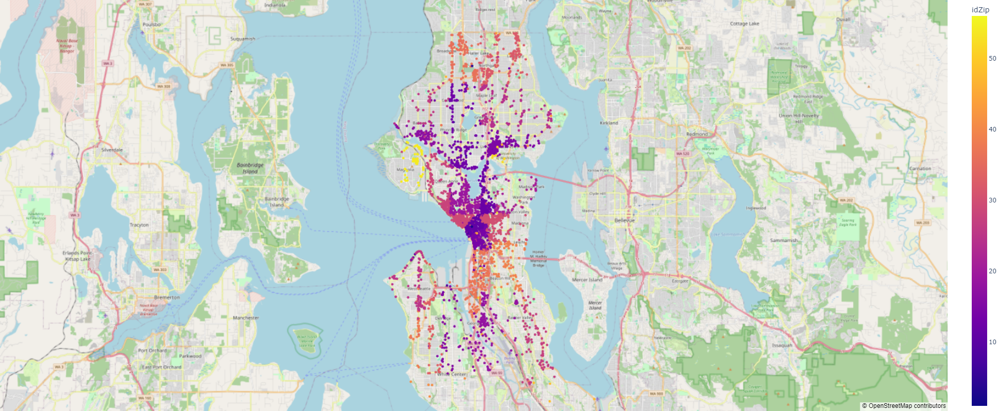

In [23]:
import plotly.express as px
fig = px.scatter_mapbox(dfZipCode, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="ZipCode", 
                        hover_data=["ZipCode", "Latitude"],
                        color="idZip",
                        #color_continuous_scale=color_scale,
                        #size=2,
                        zoom=10.5, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

> Localisation des codes postaux sur la carte

### Sélection des bâtiments non résidentiels

In [24]:
pd.DataFrame(dfDataInput[['BuildingType','PrimaryPropertyType']].value_counts())

count
BuildingType         PrimaryPropertyType               
Multifamily LR (1-4) Low-Rise Multifamily           984
Multifamily MR (5-9) Mid-Rise Multifamily           563
NonResidential       Small- and Mid-Sized Office    288
                     Other                          185
                     Warehouse                      180
                     Large Office                   168
Multifamily HR (10+) High-Rise Multifamily          105
NonResidential       Mixed Use Property             102
SPS-District K-12    K-12 School                     96
NonResidential       Retail Store                    91
                     Hotel                           76
                     Worship Facility                71
Nonresidential COS   Other                           56
NonResidential       Distribution Center             51
                     Supermarket / Grocery Store     40
                     K-12 School                     39
                     Medical Office                  38
                     Self-Storage Facility           28
                     Residence Hall                  21
                     Senior Care Community           20
                     University                      17
Multifamily LR (1-4) Senior Care Community           16
NonResidential       Refrigerated Warehouse          12
                     Restaurant                      11
Multifamily LR (1-4) Mixed Use Property              11
NonResidential       Hospital                        10
                     Laboratory                      10
Multifamily MR (5-9) Mixed Use Property               8
Nonresidential COS   Mixed Use Property               8
Campus               Other                            7
Nonresidential COS   Warehouse                        7
Multifamily MR (5-9) Senior Care Community            6
Campus               University                       6
Nonresidential COS   Large Office                     4
                     Small- and Mid-Sized Office      4
Campus               K-12 School                      4
Multifamily LR (1-4) Other                            4
Campus               Mixed Use Property               4
Multifamily HR (10+) Senior Care Community            3
Nonresidential COS   Office                           3
                     Distribution Center              2
NonResidential       Low-Rise Multifamily             2
Multifamily MR (5-9) Residence Hall                   2
SPS-District K-12    Other                            2
Multifamily LR (1-4) Small- and Mid-Sized Office      1
                     Mid-Rise Multifamily             1
                     University                       1
Campus               Large Office                     1
Nonresidential COS   Medical Office                   1
Multifamily HR (10+) Other                            1
Multifamily MR (5-9) Other                            1
Multifamily HR (10+) Hotel                            1
Campus               Restaurant                       1
Nonresidential WA    University                       1
Campus               Low-Rise Multifamily             1

In [25]:
dfDataInput_filtered=dfDataInput.copy()
filterBuildingType = dfDataInput_filtered['BuildingType'].str.contains('Multifamily')
dfDataInput_filtered = dfDataInput_filtered[~filterBuildingType]
filterBuildingType = dfDataInput_filtered['PrimaryPropertyType'].str.contains('|'.join(['Multifamily', 'Residence']))
dfDataInput_filtered = dfDataInput_filtered[~filterBuildingType]

pd.DataFrame(dfDataInput_filtered[['BuildingType','PrimaryPropertyType']].value_counts())

count
BuildingType       PrimaryPropertyType               
NonResidential     Small- and Mid-Sized Office    288
                   Other                          185
                   Warehouse                      180
                   Large Office                   168
                   Mixed Use Property             102
SPS-District K-12  K-12 School                     96
NonResidential     Retail Store                    91
                   Hotel                           76
                   Worship Facility                71
Nonresidential COS Other                           56
NonResidential     Distribution Center             51
                   Supermarket / Grocery Store     40
                   K-12 School                     39
                   Medical Office                  38
                   Self-Storage Facility           28
                   Senior Care Community           20
                   University                      17
                   Refrigerated Warehouse          12
                   Restaurant                      11
                   Laboratory                      10
                   Hospital                        10
Nonresidential COS Mixed Use Property               8
                   Warehouse                        7
Campus             Other                            7
                   University                       6
Nonresidential COS Small- and Mid-Sized Office      4
Campus             K-12 School                      4
Nonresidential COS Large Office                     4
Campus             Mixed Use Property               4
Nonresidential COS Office                           3
                   Distribution Center              2
SPS-District K-12  Other                            2
Nonresidential COS Medical Office                   1
Campus             Large Office                     1
                   Restaurant                       1
Nonresidential WA  University                       1

### effacement des features inutiles
on supprime les variables ne disposant que d'une seule valeur unique

In [26]:
delFeature(dfDataInput_filtered)

Liste des colonnes inutiles supprimées : ['DataYear', 'City', 'State']


### visualisation des informations restantes

In [27]:
dfDataInput_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1644 entries, 0 to 3375
Data columns (total 43 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    1644 non-null   int64  
 1   BuildingType                     1644 non-null   object 
 2   PrimaryPropertyType              1644 non-null   object 
 3   PropertyName                     1644 non-null   object 
 4   Address                          1644 non-null   object 
 5   ZipCode                          1628 non-null   float64
 6   TaxParcelIdentificationNumber    1644 non-null   object 
 7   CouncilDistrictCode              1644 non-null   int64  
 8   Neighborhood                     1644 non-null   object 
 9   Latitude                         1644 non-null   float64
 10  Longitude                        1644 non-null   float64
 11  YearBuilt                        1644 non-null   int64  
 12  NumberofBuildings        

## Feature engineering des données

### representation graphique

In [28]:
dfDataInput_filtered['idZip']=dfDataInput_filtered['ZipCode'].map(DictZip['id'])


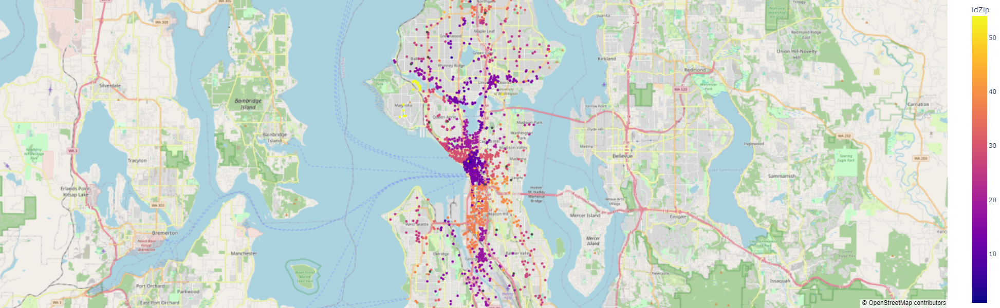

In [29]:
import plotly.express as px
fig = px.scatter_mapbox(dfDataInput_filtered, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="ZipCode", 
                        hover_data=["ZipCode", "Latitude", "PropertyName","Address"],
                        color="idZip",
                        #color_continuous_scale=color_scale,
                        #size=2,
                        zoom=10.5, 
                        height=600,
                        width=600)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### liste des outliers taggés

In [30]:
#liste des ouliers
dfDataInput_filtered.loc[dfDataInput_filtered['Outlier'].notnull()]

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,...,Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,idZip
226,350,NonResidential,Large Office,Second And Spring Building,1100 Second Avenue,98101.0,0942000045,7,DOWNTOWN,47.60642,...,39794668.0,16048.309570,1604831.0,False,NaN,Non-Compliant,High outlier,362.66,2.10,11.0
384,539,NonResidential,Retail Store,University Center,4501 Roosevelt Way NE,98105.0,5335200380,4,NORTHEAST,47.66178,...,318963.0,0.000000,0.0,False,NaN,Non-Compliant,Low outlier,2.22,0.03,15.0
448,608,NonResidential,Large Office,411 1ST AVE S (ID608),411 1ST AVE S,98104.0,5247800200,2,DOWNTOWN,47.59878,...,1608768.0,3430.500488,343050.0,False,NaN,Non-Compliant,Low outlier,29.43,0.19,14.0
517,704,NonResidential,Large Office,401 Elliott Ave West,401 Elliot Ave West,98119.0,7666202110,7,MAGNOLIA / QUEEN ANNE,47.62235,...,27137187.0,0.000000,0.0,False,NaN,Non-Compliant,High outlier,189.18,1.46,28.0
839,19967,SPS-District K-12,K-12 School,Queen Anne Gym,1431 2nd Ave N,98109.0,0811000005,7,MAGNOLIA / QUEEN ANNE,47.63203,...,246628.0,1848.439575,184844.0,True,NaN,Error - Correct Default Data,Low outlier,11.54,0.32,19.0
1045,20617,NonResidential,Retail Store,Seattle Habitat Store,21 S Nevada St,98134.0,1824049074,2,GREATER DUWAMISH,47.56535,...,49005.0,964.640015,96464.0,True,NaN,Error - Correct Default Data,Low outlier,5.46,0.14,37.0
1229,21315,NonResidential,Small- and Mid-Sized Office,1518 Fifith Ave,1520 Fifth Ave,98101.0,1975700135,7,DOWNTOWN,47.61119,...,24105.0,0.000000,0.0,False,NaN,Non-Compliant,Low outlier,0.17,0.00,11.0
1295,21474,NonResidential,Other,The Lusty Lady,1315 1st Ave,98101.0,1976200060,7,DOWNTOWN,47.60711,...,44294.0,0.000000,0.0,False,NaN,Non-Compliant,Low outlier,0.31,0.01,11.0
1611,22830,NonResidential,Worship Facility,Freedom Church,9601 35th Ave,98126.0,2858600090,1,SOUTHWEST,47.51709,...,100842.0,0.000000,0.0,False,NaN,Non-Compliant,Low outlier,0.70,0.03,33.0
1945,23912,NonResidential,Small- and Mid-Sized Office,1416 S Jackson,1416 South Jackson Street,98133.0,3320000165,3,CENTRAL,47.59973,...,141784.0,1430.729858,143073.0,False,NaN,Non-Compliant,Low outlier,8.59,0.19,36.0


In [31]:
# nous supprimons les 16 ouliers
index2del=dfDataInput_filtered.loc[dfDataInput_filtered['Outlier'].notnull()].index
delIndividus(dfDataInput_filtered,index2del)
# on supprime la feature
delFeature(dfDataInput_filtered,['Outlier'])

------------------ Purge des individus ------------------

-- suppression de  16  indexes du DataFrame  dfDataInput_filtered
Liste des colonnes supprimées : ['Outlier']


In [32]:
# visualisation des données conformes avec feature 'ComplianceStatus'
dfDataInput_filtered['ComplianceStatus'].value_counts()

ComplianceStatus
Compliant                       1525
Error - Correct Default Data      86
Missing Data                      14
Non-Compliant                      3
Name: count, dtype: int64

In [33]:
# nous ne gardons que les valeurs conformes et supprimons la variable 'ComplianceStatus'
index2del=dfDataInput_filtered.loc[dfDataInput_filtered['ComplianceStatus']!='Compliant'].index
delIndividus(dfDataInput_filtered,index2del)
# on supprime la feature
delFeature(dfDataInput_filtered,['ComplianceStatus'])

------------------ Purge des individus ------------------

-- suppression de  103  indexes du DataFrame  dfDataInput_filtered
Liste des colonnes supprimées : ['ComplianceStatus']


In [34]:
delFeature(dfDataInput_filtered)

Liste des colonnes inutiles supprimées : ['DefaultData']


In [35]:
dfDataInput_filtered.columns

Index(['OSEBuildingID', 'BuildingType', 'PrimaryPropertyType', 'PropertyName',
       'Address', 'ZipCode', 'TaxParcelIdentificationNumber',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'YearsENERGYSTARCertified',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)',
       'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)',
       'Comments', 'TotalGHGEmissions', 'GHGEmissionsIntensity', 'idZip'],
      dtype='object')

### inspection des datas

In [36]:
print(dfDataInput_filtered.describe(include=['float', 'int']))

       OSEBuildingID       ZipCode  CouncilDistrictCode     Latitude  \
count    1525.000000   1512.000000          1525.000000  1525.000000   
mean    16322.086557  98116.597222             4.413115    47.616044   
std     13740.289718     18.181810             2.202024     0.047100   
min         1.000000  98006.000000             1.000000    47.509590   
25%       599.000000  98104.000000             2.000000    47.587160   
50%     21177.000000  98109.000000             4.000000    47.612340   
75%     24598.000000  98125.000000             7.000000    47.648220   
max     50226.000000  98199.000000             7.000000    47.733870   

         Longitude    YearBuilt  NumberofBuildings  NumberofFloors  \
count  1525.000000  1525.000000        1525.000000     1525.000000   
mean   -122.333691  1961.629508           1.182295        4.285902   
std       0.023314    32.825532           3.061843        6.819925   
min    -122.411820  1900.000000           0.000000        0.000000   
2

In [37]:
dfDataInput_filtered['NumberofFloors'].value_counts().sort_index()

NumberofFloors
0      12
1     422
2     350
3     234
4     135
5     101
6      81
7      32
8      22
9       7
10     18
11     18
12      9
13      7
14      9
15      5
16      3
17      4
18      3
19      5
20      3
21      3
22      3
23      3
24      3
25      3
27      1
28      1
29      3
30      1
33      3
34      2
36      2
37      1
39      1
41      2
42      5
46      1
47      1
49      1
55      1
56      1
63      1
76      1
99      1
Name: count, dtype: int64

12 batiments avec 0 étage
1 batiment de 99 étages
batiment le plus grand 76 étages

In [38]:
#batiments avec 0 étages
dfDataInput_filtered[dfDataInput_filtered['NumberofFloors']<1]

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,...,SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity,idZip
166,267,NonResidential,Hotel,Grand Hyatt Seattle,721 Pine St,98101.0,6792120000,7,DOWNTOWN,47.61275,...,66502836.0,0.0,1.153696e+07,39364114.0,256831.625000,25683162.0,NaN,1638.46,1.75,11.0
487,656,NonResidential,Medical Office,Arnold Pavilion,1221 Madison Street,98104.0,8725990000,3,EAST,47.60979,...,20764814.0,7815663.0,3.735333e+06,12744957.0,0.000000,0.0,NaN,692.12,3.06,14.0
488,657,NonResidential,Mixed Use Property,2200 Westlake - SEDO,2200 Westlake Ave.,98121.0,8729740000,7,DOWNTOWN,47.61783,...,40754364.0,0.0,8.626261e+06,29432803.0,99705.117190,9970512.0,NaN,734.72,1.42,29.0
564,758,NonResidential,Other,Pacific Place,600 Pine Street,98101.0,6600470000,7,DOWNTOWN,47.61289,...,46343304.0,0.0,1.363158e+07,46510954.0,0.000000,0.0,NaN,324.25,0.34,11.0
1754,23311,NonResidential,Medical Office,HART First Hill LLC,1124 Columbia Street,98104.0,8590900646,3,EAST,47.60862,...,25358122.0,13296249.0,3.521476e+06,12015275.0,0.000000,0.0,NaN,1110.07,4.04,14.0
1993,24086,Campus,Other,(ID#24086)Campus1:KC Metro Transit Atlantic Ce...,1333 AIRPORT WAY S,98134.0,7666203387,2,GREATER DUWAMISH,47.59042,...,22230844.0,0.0,4.519276e+06,15419770.0,56025.152340,5602515.0,NaN,405.05,1.75,37.0
3130,40028,NonResidential,Warehouse,Sandpoint #5,7561 63rd Ave NE,98115.0,0225049077,4,NORTHEAST,47.68454,...,16139557.0,0.0,2.642108e+06,9014872.0,61918.878910,6191888.0,NaN,391.70,1.02,24.0
3131,40031,NonResidential,Medical Office,Sandpoint #25,6222 NE 74th St,98115.0,0225049077,4,NORTHEAST,47.68240,...,2279632.5,0.0,5.320647e+05,1815405.0,3777.100342,377710.0,NaN,32.72,1.08,24.0
3132,40034,NonResidential,Small- and Mid-Sized Office,Sandpoint #29,6200 NE 74th ST,98115.0,0225049077,4,NORTHEAST,47.68254,...,4292216.0,0.0,4.099035e+05,1398591.0,25486.185550,2548619.0,NaN,145.11,6.62,24.0
3168,49705,Nonresidential COS,Other,Magnuson,7400 Sand Point Way NE,98115.0,0225049062,4,NORTHEAST,47.68212,...,20672948.0,0.0,2.743225e+06,9359884.0,91104.546880,9110455.0,NaN,549.11,1.09,24.0


In [39]:
# batiment avec 99 étages --> église baptiste
dfDataInput_filtered[dfDataInput_filtered['NumberofFloors']>76]

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,...,SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity,idZip
1359,21611,NonResidential,Worship Facility,Seattle Chinese Baptist Church,5801 Beacon Avenue South,98108.0,2124049098,2,GREATER DUWAMISH,47.55072,...,326001.1875,0.0,95545.5,326001.0,0.0,0.0,NaN,2.27,0.1,18.0


In [40]:
# on supprime les valeurs à 0
index2del=dfDataInput_filtered[dfDataInput_filtered['NumberofFloors']<1].index
delIndividus(dfDataInput_filtered,index2del)
# on supprime l'église
index2del=dfDataInput_filtered[dfDataInput_filtered['NumberofFloors']>76].index
delIndividus(dfDataInput_filtered,index2del)

------------------ Purge des individus ------------------

-- suppression de  12  indexes du DataFrame  dfDataInput_filtered
------------------ Purge des individus ------------------

-- suppression de  1  indexes du DataFrame  dfDataInput_filtered


In [41]:
dfDataInput_filtered['Comments'].value_counts()

Series([], Name: count, dtype: int64)

In [42]:
# on supprime la feature
delFeature(dfDataInput_filtered,['Comments'])

Liste des colonnes supprimées : ['Comments']


In [43]:
#suppression des colonnes redondantes
delFeature(dfDataInput_filtered,['Electricity(kWh)','NaturalGas(therms)'])

Liste des colonnes supprimées : ['Electricity(kWh)', 'NaturalGas(therms)']


In [44]:
dfDataInput_filtered.replace(to_replace=[r"\\t|\\n|\\r", "\t|\n|\r"], value=["",""], regex=True, inplace=True)

In [45]:
# pourcentage des types de batiments
dfDataInput_filtered['BuildingType'].value_counts(normalize=True).round(2)

BuildingType
NonResidential        0.93
Nonresidential COS    0.05
Campus                0.01
SPS-District K-12     0.01
Nonresidential WA     0.00
Name: proportion, dtype: float64

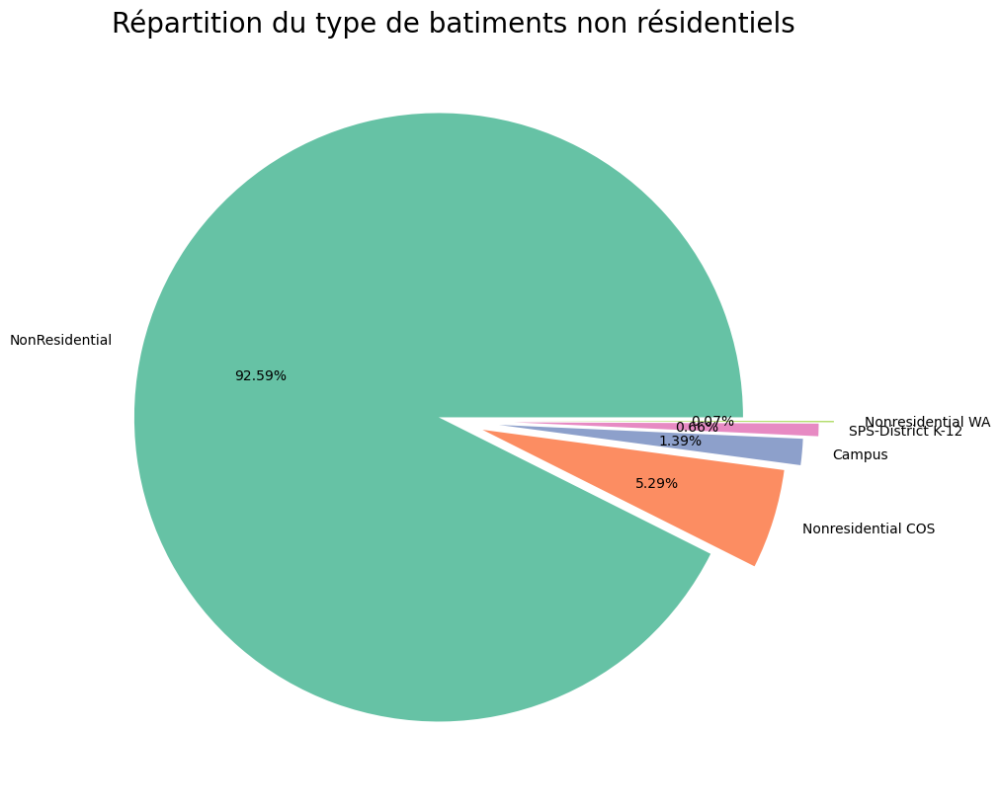

In [46]:
plt.figure(figsize=(10,10))
plt.title('Répartition du type de batiments non résidentiels', loc='center', fontdict={'fontsize':20})
graph=plt.pie(
    dfDataInput_filtered['BuildingType'].value_counts(),
    labels=dfDataInput_filtered['BuildingType'].value_counts().index,
    autopct='%1.2f%%',
    # Use Seaborn's color palette 'Set2'
    colors=sns.color_palette('Set2'),
    explode=[0.05, 0.10, 0.15, 0.20, 0.25]

)


In [47]:
# pourcentage des types de batiments
dfDataInput_filtered['PrimaryPropertyType'].value_counts(normalize=True).round(2)

PrimaryPropertyType
Small- and Mid-Sized Office    0.19
Other                          0.16
Warehouse                      0.12
Large Office                   0.11
Mixed Use Property             0.07
Retail Store                   0.06
Hotel                          0.05
Worship Facility               0.04
Distribution Center            0.04
K-12 School                    0.03
Supermarket / Grocery Store    0.03
Medical Office                 0.02
Self-Storage Facility          0.02
University                     0.02
Senior Care Community          0.01
Refrigerated Warehouse         0.01
Restaurant                     0.01
Hospital                       0.01
Laboratory                     0.01
Name: proportion, dtype: float64

In [48]:
dfDataInput_filtered['PrimaryPropertyType'].value_counts()

PrimaryPropertyType
Small- and Mid-Sized Office    285
Other                          241
Warehouse                      184
Large Office                   169
Mixed Use Property             112
Retail Store                    85
Hotel                           74
Worship Facility                68
Distribution Center             53
K-12 School                     50
Supermarket / Grocery Store     40
Medical Office                  36
Self-Storage Facility           28
University                      23
Senior Care Community           20
Refrigerated Warehouse          12
Restaurant                      12
Hospital                        10
Laboratory                      10
Name: count, dtype: int64

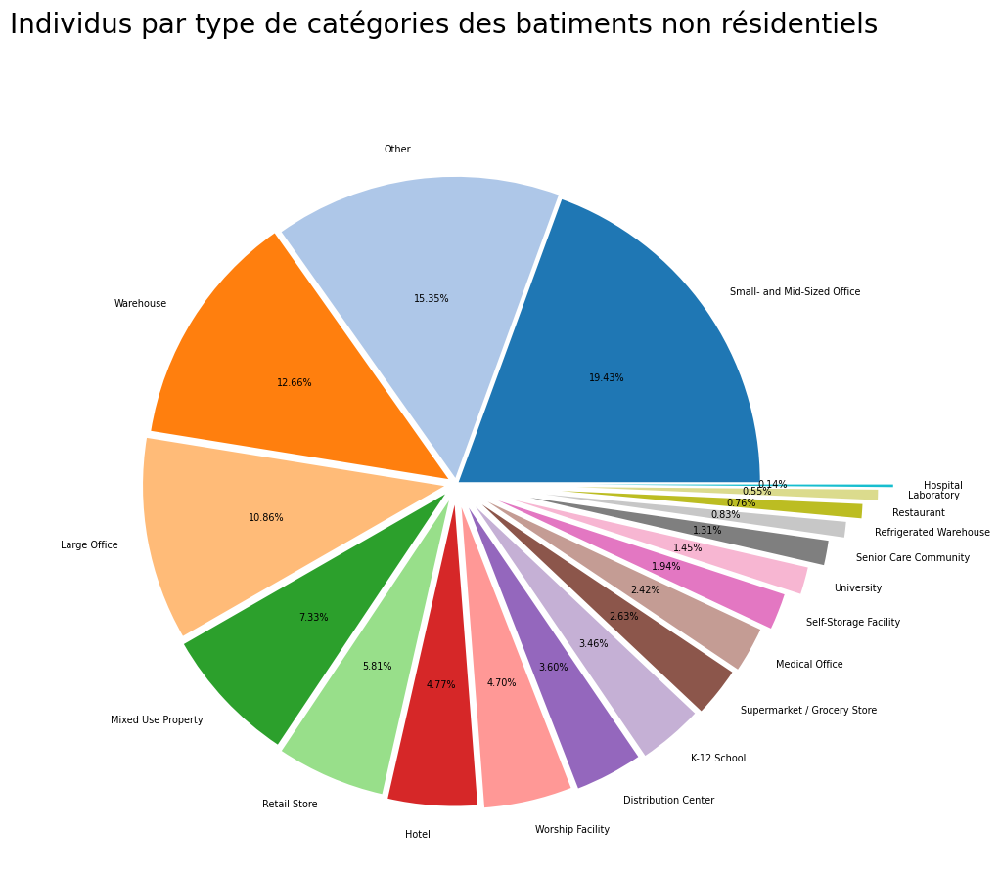

In [124]:
fig=plt.figure(figsize=(10,10))
fig.suptitle('Individus par type de catégories des batiments non résidentiels', size=20)
graph=plt.pie(
    dfDataInput_filtered['PrimaryPropertyType'].value_counts(),
    labels=dfDataInput_filtered['PrimaryPropertyType'].value_counts().index,
    autopct='%1.2f%%',
    colors=sns.color_palette('tab20'),
    explode=[0.01, 0.02, 0.03, 0.04, 0.05,0.06, 0.07, 0.08, 0.09, 0.10,0.11, 0.12, 0.15, 0.20, 0.25,0.30, 0.35, 0.40, 0.45]
)


In [50]:
dfConsoType=pd.DataFrame(dfDataInput_filtered.groupby(['PrimaryPropertyType'])['SiteEnergyUse(kBtu)'].sum())
dfConsoType['prctNrj']=(dfConsoType['SiteEnergyUse(kBtu)'])*100/(dfConsoType['SiteEnergyUse(kBtu)'].sum())
#dfConsoType = dfConsoType.merge(orderColor, on=['PrimaryPropertyType'])
dfConsoType=dfConsoType.sort_values(by='prctNrj',ascending=False)

dfConsoType

,SiteEnergyUse(kBtu),prctNrj
PrimaryPropertyType,,
Large Office,2.960018e+09,23.688699
Other,2.173971e+09,17.398047
Hospital,1.415470e+09,11.327849
Mixed Use Property,1.319988e+09,10.563721
Hotel,8.418106e+08,6.736917
Small- and Mid-Sized Office,7.571734e+08,6.059575
University,4.510220e+08,3.609479
Retail Store,4.217251e+08,3.375019
Medical Office,4.188294e+08,3.351845


In [51]:
palette_perso=[sns.color_palette('tab20')[3],
               sns.color_palette('tab20')[1],
               sns.color_palette('tab20')[17],
               sns.color_palette('tab20')[4],
               sns.color_palette('tab20')[6],
               sns.color_palette('tab20')[0],
               sns.color_palette('tab20')[13],
               sns.color_palette('tab20')[5],
               sns.color_palette('tab20')[11],
               sns.color_palette('tab20')[10],
               sns.color_palette('tab20')[2],
               sns.color_palette('tab20')[18],
               sns.color_palette('tab20')[14],
               sns.color_palette('tab20')[9],
               sns.color_palette('tab20')[8],
               sns.color_palette('tab20')[7],
               sns.color_palette('tab20')[16],
               sns.color_palette('tab20')[15],
               sns.color_palette('tab20')[12],
               sns.color_palette('tab20')[19]]


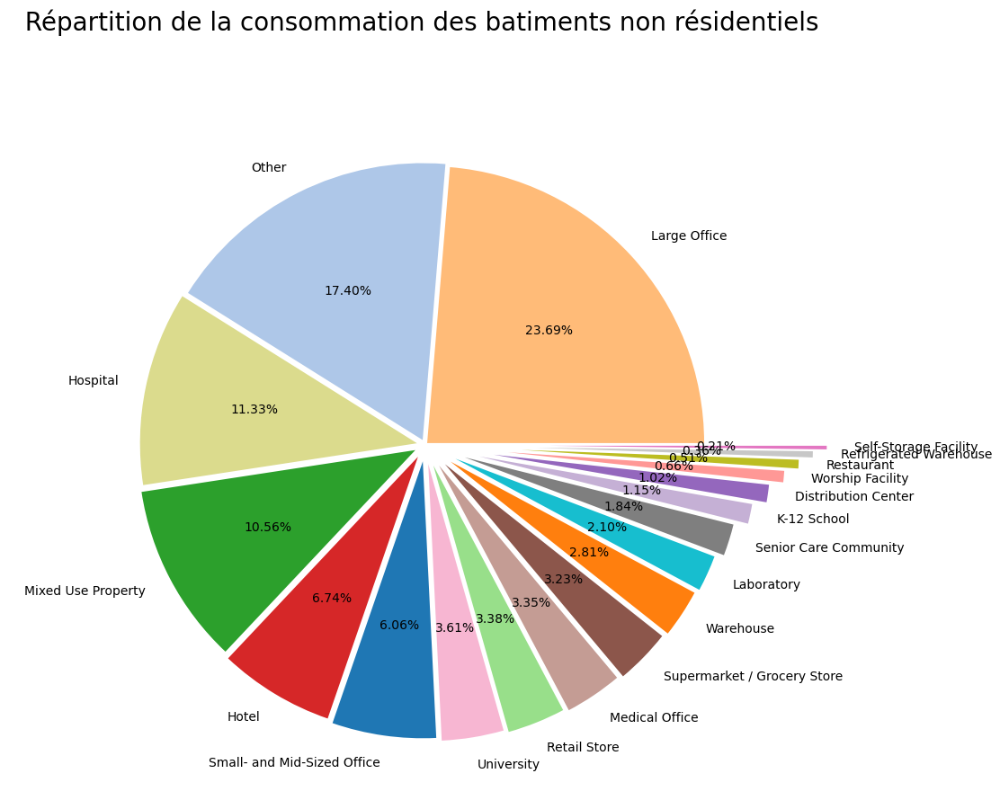

In [52]:
fig=plt.figure(figsize=(10,10))
fig.suptitle('  Répartition de la consommation des batiments non résidentiels', size=20)
graph=plt.pie(
    dfConsoType['prctNrj'],
    labels=dfConsoType.index,
    autopct='%1.2f%%',
    colors=palette_perso,
    explode=[0.01, 0.02, 0.03, 0.04, 0.05,0.06, 0.07, 0.08, 0.09, 0.10,0.11, 0.12, 0.15, 0.20, 0.25,0.30, 0.35, 0.40, 0.45]
)

In [53]:
dfDataInput_filtered.dtypes

OSEBuildingID                        int64
BuildingType                        object
PrimaryPropertyType                 object
PropertyName                        object
Address                             object
ZipCode                            float64
TaxParcelIdentificationNumber       object
CouncilDistrictCode                  int64
Neighborhood                        object
Latitude                           float64
Longitude                          float64
YearBuilt                            int64
NumberofBuildings                  float64
NumberofFloors                       int64
PropertyGFATotal                     int64
PropertyGFAParking                   int64
PropertyGFABuilding(s)               int64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
SecondLargestPropertyUseType        object
SecondLargestPropertyUseTypeGFA    float64
ThirdLargestPropertyUseType         object
ThirdLarges

In [54]:
print(pd.DataFrame(dfDataInput_filtered[['BuildingType','PrimaryPropertyType']].value_counts()))

                                                count
BuildingType       PrimaryPropertyType               
NonResidential     Small- and Mid-Sized Office    281
                   Other                          179
                   Warehouse                      177
                   Large Office                   164
                   Mixed Use Property             100
                   Retail Store                    85
                   Hotel                           74
                   Worship Facility                68
Nonresidential COS Other                           54
NonResidential     Distribution Center             51
                   Supermarket / Grocery Store     40
                   K-12 School                     38
                   Medical Office                  35
                   Self-Storage Facility           28
                   Senior Care Community           20
                   University                      17
                   Refrigera

In [55]:
dfDataInput_filtered.shape

(1512, 38)

In [56]:
dfDataInput_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1512 entries, 0 to 3375
Data columns (total 38 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    1512 non-null   int64  
 1   BuildingType                     1512 non-null   object 
 2   PrimaryPropertyType              1512 non-null   object 
 3   PropertyName                     1512 non-null   object 
 4   Address                          1512 non-null   object 
 5   ZipCode                          1499 non-null   float64
 6   TaxParcelIdentificationNumber    1512 non-null   object 
 7   CouncilDistrictCode              1512 non-null   int64  
 8   Neighborhood                     1512 non-null   object 
 9   Latitude                         1512 non-null   float64
 10  Longitude                        1512 non-null   float64
 11  YearBuilt                        1512 non-null   int64  
 12  NumberofBuildings        

In [57]:
dfDataInput_filtered.iloc[:,0:20].describe()

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA
count,1512.000000,1499.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1.512000e+03,1512.000000,1.512000e+03,1.508000e+03
mean,16236.841931,98116.643763,4.416005,47.615949,-122.333957,1961.551587,1.101190,4.257275,1.142097e+05,14100.925265,1.001087e+05,9.294601e+04
std,13649.698851,18.234523,2.205122,0.047110,0.023078,32.810266,1.176518,6.389669,1.967924e+05,44181.698581,1.736075e+05,1.624820e+05
min,1.000000,98006.000000,1.000000,47.509590,-122.411820,1900.000000,0.000000,1.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03
25%,596.750000,98104.000000,2.000000,47.586950,-122.343290,1930.000000,1.000000,1.000000,2.884700e+04,0.000000,2.793675e+04,2.501575e+04
50%,21147.500000,98109.000000,4.000000,47.612335,-122.333275,1965.000000,1.000000,2.000000,4.812550e+04,0.000000,4.606350e+04,4.192100e+04
75%,24589.500000,98125.000000,7.000000,47.647960,-122.323215,1988.000000,1.000000,4.000000,1.044605e+05,0.000000,9.441750e+04,9.008625e+04
max,50226.000000,98199.000000,7.000000,47.733870,-122.261800,2015.000000,27.000000,76.000000,2.200000e+06,512608.000000,2.200000e+06,1.719643e+06


> NumberofBuildings == 0 ? --> on regarde ça

In [58]:
dfDataInput_filtered.loc[dfDataInput_filtered['NumberofBuildings']==0,['NumberofBuildings']].value_counts()

NumberofBuildings
0.0                  50
Name: count, dtype: int64

In [59]:
dfDataInput_filtered.loc[dfDataInput_filtered['NumberofBuildings']==0,['NumberofBuildings','BuildingType','PrimaryPropertyType','PropertyName','Address']]

,NumberofBuildings,BuildingType,PrimaryPropertyType,PropertyName,Address
63,0.0,NonResidential,Medical Office,Polyclinic North && South,1200 Harvard Ave
76,0.0,NonResidential,Small- and Mid-Sized Office,KCTS9,401 Mercer St
160,0.0,NonResidential,Warehouse,Harbor Island: Warehouse E - DNRP-SWD,3235 16TH AVE SW
201,0.0,NonResidential,Large Office,Cox Media Group Seattle KIRO TV (322),2801 3rd Ave
241,0.0,NonResidential,Small- and Mid-Sized Office,University District Office Buiding,1107 NE 45th St
264,0.0,NonResidential,Mixed Use Property,Thaw Building,8300 Military Rd South
278,0.0,NonResidential,Large Office,Fourth and Pike Building,1424 4th Ave
280,0.0,NonResidential,Hotel,Motif Seattle,1414 4th Ave
291,0.0,NonResidential,Other,Meridian (East),1501 7th Ave
358,0.0,Nonresidential COS,Other,Westbridge,4209 W Marginal Way SW


In [60]:
# on met la valeur SecondLargestPropertyUseTypeGFA et ThirdLargestPropertyUseTypeGFA a O ou elle était a NAN
dfDataInput_filtered.loc[dfDataInput_filtered['LargestPropertyUseTypeGFA'].isna(),'LargestPropertyUseTypeGFA']=0
dfDataInput_filtered.loc[dfDataInput_filtered['SecondLargestPropertyUseTypeGFA'].isna(),'SecondLargestPropertyUseTypeGFA']=0
dfDataInput_filtered.loc[dfDataInput_filtered['ThirdLargestPropertyUseTypeGFA'].isna(),'ThirdLargestPropertyUseTypeGFA']=0


In [61]:
dfDataInput_filtered.iloc[:,:23].describe()

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA
count,1512.000000,1499.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1.512000e+03,1512.000000,1.512000e+03,1.512000e+03,1512.000000
mean,16236.841931,98116.643763,4.416005,47.615949,-122.333957,1961.551587,1.101190,4.257275,1.142097e+05,14100.925265,1.001087e+05,9.270012e+04,19435.530620
std,13649.698851,18.234523,2.205122,0.047110,0.023078,32.810266,1.176518,6.389669,1.967924e+05,44181.698581,1.736075e+05,1.623371e+05,51004.157677
min,1.000000,98006.000000,1.000000,47.509590,-122.411820,1900.000000,0.000000,1.000000,1.128500e+04,0.000000,3.636000e+03,0.000000e+00,0.000000
25%,596.750000,98104.000000,2.000000,47.586950,-122.343290,1930.000000,1.000000,1.000000,2.884700e+04,0.000000,2.793675e+04,2.499750e+04,0.000000
50%,21147.500000,98109.000000,4.000000,47.612335,-122.333275,1965.000000,1.000000,2.000000,4.812550e+04,0.000000,4.606350e+04,4.170550e+04,0.000000
75%,24589.500000,98125.000000,7.000000,47.647960,-122.323215,1988.000000,1.000000,4.000000,1.044605e+05,0.000000,9.441750e+04,9.000000e+04,13623.250000
max,50226.000000,98199.000000,7.000000,47.733870,-122.261800,2015.000000,27.000000,76.000000,2.200000e+06,512608.000000,2.200000e+06,1.719643e+06,639931.000000


In [62]:
dfDataInput_filtered.iloc[:,23:].describe()

,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,idZip
count,1512.000000,970.000000,1512.000000,1511.000000,1512.000000,1512.000000,1.512000e+03,1.511000e+03,1.512000e+03,1.512000e+03,1.512000e+03,1512.000000,1512.000000,1499.000000
mean,3311.012168,63.772165,75.350728,77.844342,184.042923,186.297817,8.264211e+06,8.405905e+06,4.908315e+05,5.698424e+06,2.029341e+06,185.390569,1.667269,23.741161
std,18624.697685,28.912962,75.932488,76.937132,189.802122,189.785588,2.242735e+07,2.293617e+07,5.348316e+06,1.380116e+07,9.798744e+06,734.366023,2.426781,10.273937
min,0.000000,1.000000,1.400000,0.000000,0.000000,-2.100000,5.713320e+04,0.000000e+00,0.000000e+00,-1.154170e+05,0.000000e+00,-0.800000,-0.020000,1.000000
25%,0.000000,44.000000,34.900002,37.099998,81.099998,83.875000,1.242775e+06,1.312356e+06,0.000000e+00,7.288942e+05,0.000000e+00,20.297500,0.360000,14.000000
50%,0.000000,71.000000,53.599998,56.099998,138.849998,142.149994,2.711055e+06,2.810298e+06,0.000000e+00,1.711462e+06,4.761960e+05,49.485000,0.880000,19.000000
75%,0.000000,89.000000,85.249998,88.100002,213.249996,215.675003,7.267172e+06,7.442882e+06,0.000000e+00,5.185815e+06,1.528624e+06,144.962500,1.950000,32.000000
max,459748.000000,100.000000,834.400024,834.400024,2620.000000,2620.000000,4.483853e+08,4.716139e+08,1.349435e+08,2.745325e+08,2.979090e+08,16870.980000,34.090000,54.000000


> les chiffres negatifs peuvent representer la production d'énergie donc on les garde

In [63]:
dfDataInput_filtered.loc[dfDataInput_filtered['NumberofBuildings']==0,'NumberofBuildings']=1

In [64]:
pd.crosstab(dfDataInput_filtered['NumberofFloors'], dfDataInput_filtered['YearBuilt'])

YearBuilt,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
NumberofFloors,,,,,,,,,,,,,,,,,,,,,
1,8,0,0,0,0,0,1,0,0,0,...,0,2,3,2,1,2,0,5,1,0
2,6,1,2,0,1,1,1,2,0,0,...,1,3,2,1,3,1,3,0,4,1
3,10,0,2,1,1,0,5,1,4,5,...,1,2,1,4,0,0,0,3,1,1
4,7,1,3,0,4,0,2,1,2,1,...,5,3,6,1,0,0,0,1,2,0
5,4,0,0,0,2,1,2,3,1,1,...,1,0,6,5,1,0,0,1,0,1
6,5,0,1,0,1,1,0,3,1,3,...,4,0,2,3,1,0,1,4,1,1
7,2,0,0,0,1,0,1,1,2,2,...,0,0,0,1,0,0,1,0,1,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,2,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


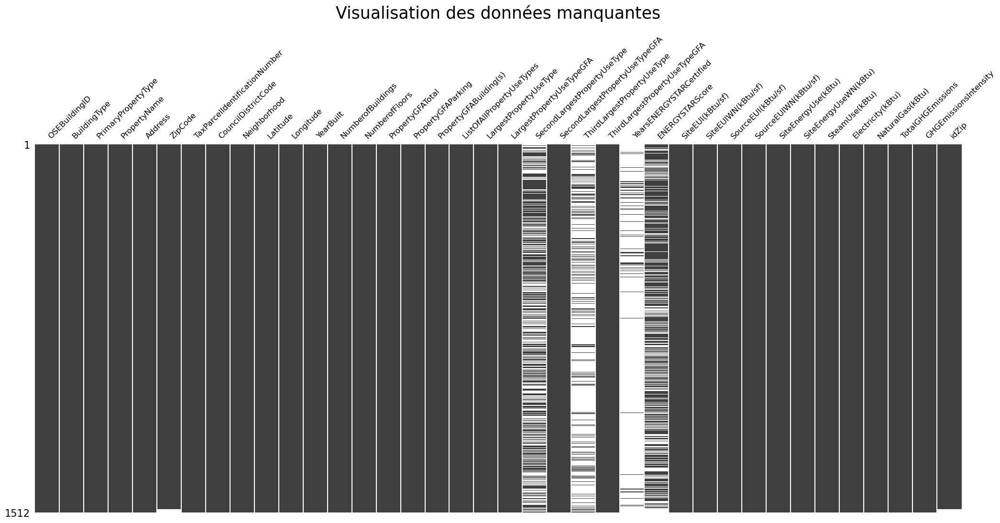

In [65]:
msno.matrix(dfDataInput_filtered, fontsize=12, sparkline=False)
plt.title("Visualisation des données manquantes", fontsize=25, pad=25)
plt.show()

<Axes: title={'center': "Corrélations de pearson entre les features d'origine"}>

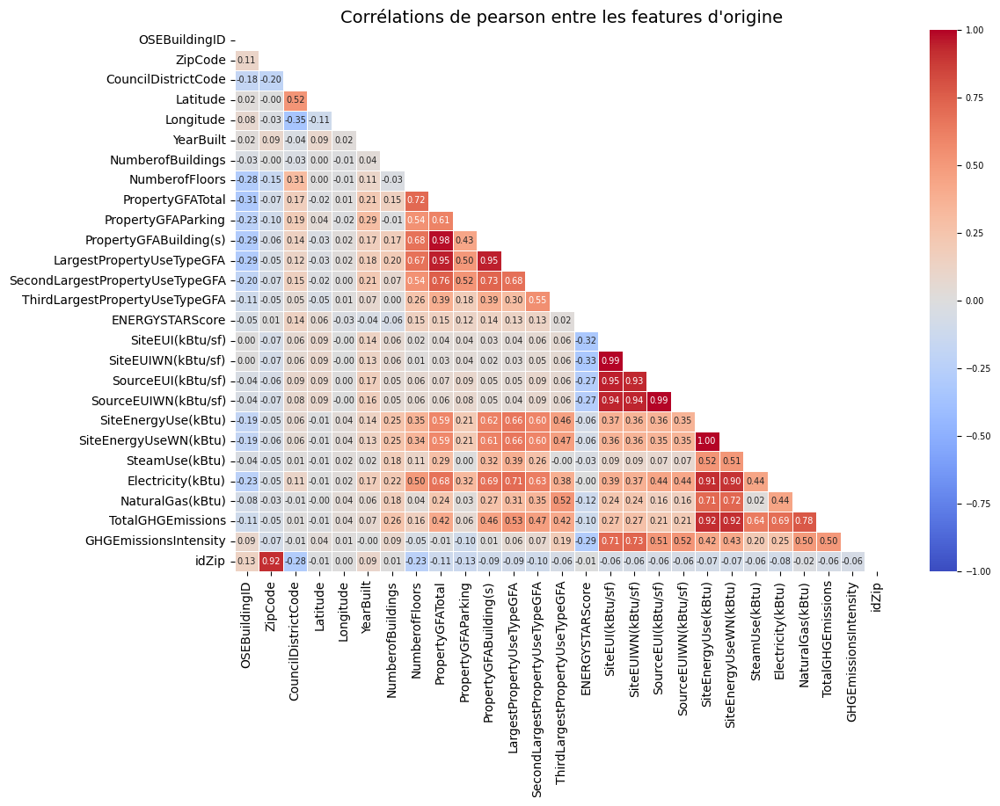

In [66]:
correlation_features = dfDataInput_filtered.select_dtypes(exclude=['object']).corr()
plt.figure(figsize = (12,8))
plt.title("Corrélations de pearson entre les features d'origine", fontsize=14)
plt.rcParams.update({'font.size': 7})
mask = np.triu(np.ones_like(correlation_features, dtype=bool))
sns.heatmap(correlation_features, vmin=-1, vmax=1, cmap ='coolwarm', linewidths = 0.5, annot = True, fmt=".2f", mask = mask) 

In [67]:
dfDataInput_filtered[['PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)','NumberofBuildings', 'NumberofFloors',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA']].head()

,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),NumberofBuildings,NumberofFloors,LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
0,88434,0,88434,1.0,12,88434.0,0.0,0.0
1,103566,15064,88502,1.0,11,83880.0,15064.0,4622.0
2,956110,196718,759392,1.0,41,756493.0,0.0,0.0
3,61320,0,61320,1.0,10,61320.0,0.0,0.0
4,175580,62000,113580,1.0,18,123445.0,68009.0,0.0


In [68]:
dfDataInput_filtered['Prct_Parking']=round(dfDataInput_filtered['PropertyGFAParking']*100/dfDataInput_filtered['PropertyGFATotal'],2)      # pourcentage de la surface parking
#dfDataInput_filtered['Prct_Building']=round(dfDataInput_filtered['PropertyGFABuilding(s)']*100/dfDataInput_filtered['PropertyGFATotal'],2) # pourcentage de la surface batiment
#dfDataInput_filtered['Prct_Largest']=round(dfDataInput_filtered['LargestPropertyUseTypeGFA']*100/(dfDataInput_filtered['LargestPropertyUseTypeGFA']+dfDataInput_filtered['SecondLargestPropertyUseTypeGFA']+dfDataInput_filtered['ThirdLargestPropertyUseTypeGFA']),2) # pourcentage de la surface batiment
dfDataInput_filtered['Prct_Second']=round(dfDataInput_filtered['SecondLargestPropertyUseTypeGFA']*100/(dfDataInput_filtered['LargestPropertyUseTypeGFA']+dfDataInput_filtered['SecondLargestPropertyUseTypeGFA']+dfDataInput_filtered['ThirdLargestPropertyUseTypeGFA']),2) # pourcentage de la deuxieme utilisation
dfDataInput_filtered['Prct_Third']=round(dfDataInput_filtered['ThirdLargestPropertyUseTypeGFA']*100/(dfDataInput_filtered['LargestPropertyUseTypeGFA']+dfDataInput_filtered['SecondLargestPropertyUseTypeGFA']+dfDataInput_filtered['ThirdLargestPropertyUseTypeGFA']),2) # pourcentage de la troisieme utilisation

In [69]:
dfDataInput_filtered.loc[dfDataInput_filtered['Prct_Second'].isna(),'Prct_Second']=0
dfDataInput_filtered.loc[dfDataInput_filtered['Prct_Third'].isna(),'Prct_Third']=0

In [70]:
dfDataInput_filtered['AgeBuilding']=2024-dfDataInput_filtered['YearBuilt'] # age des batiments
delFeature(dfDataInput_filtered,['YearBuilt'])

Liste des colonnes supprimées : ['YearBuilt']


In [71]:
delFeature(dfDataInput_filtered,['SiteEUIWN(kBtu/sf)','SourceEUIWN(kBtu/sf)','SiteEnergyUseWN(kBtu)'])

Liste des colonnes supprimées : ['SiteEUIWN(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)']


In [72]:
delFeature(dfDataInput_filtered,['PropertyGFAParking','PropertyGFABuilding(s)','LargestPropertyUseTypeGFA','SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseTypeGFA'])

Liste des colonnes supprimées : ['PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA']


In [73]:
dfDataInput_filtered[['PropertyGFATotal', 'Prct_Parking','NumberofBuildings', 'NumberofFloors',
       'Prct_Second','Prct_Third']].head()

,PropertyGFATotal,Prct_Parking,NumberofBuildings,NumberofFloors,Prct_Second,Prct_Third
0,88434,0.00,1.0,12,0.00,0.00
1,103566,14.55,1.0,11,14.55,4.46
2,956110,20.57,1.0,41,0.00,0.00
3,61320,0.00,1.0,10,0.00,0.00
4,175580,35.31,1.0,18,35.52,0.00


<Axes: title={'center': 'Corrélations de pearson entre les features'}>

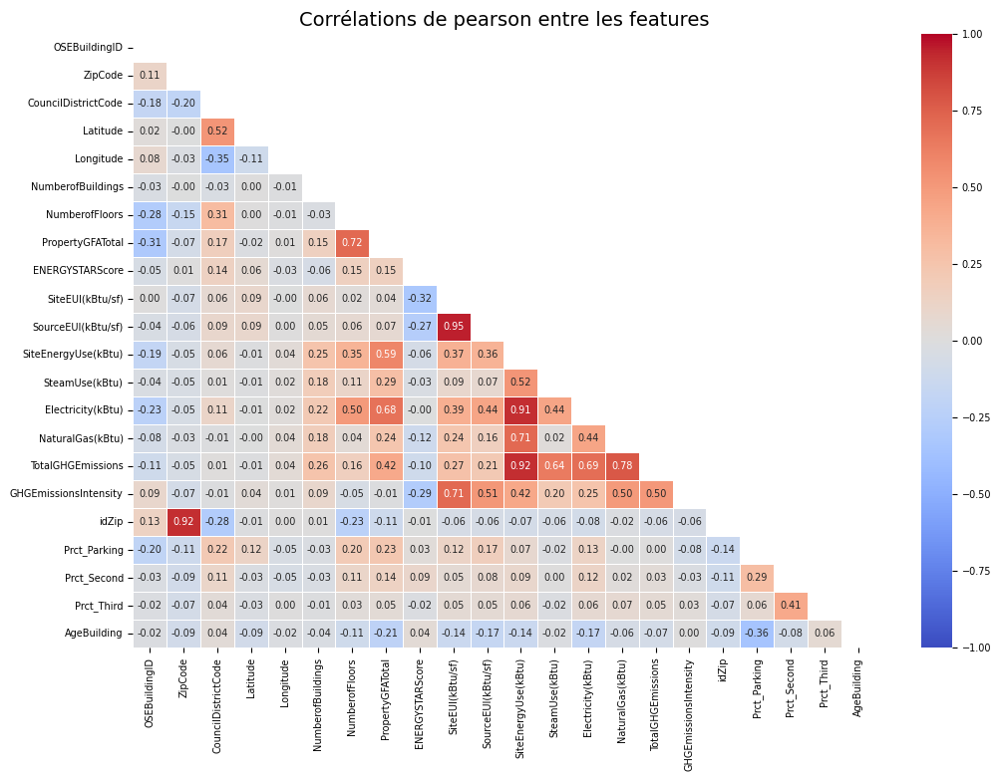

In [74]:
correlation_features = dfDataInput_filtered.select_dtypes(exclude=['object']).corr()
plt.figure(figsize = (12,8))
plt.title("Corrélations de pearson entre les features", fontsize=14)
plt.rcParams.update({'font.size': 7})
mask = np.triu(np.ones_like(correlation_features, dtype=bool))
sns.heatmap(correlation_features, vmin=-1, vmax=1, cmap ='coolwarm', linewidths = 0.5, annot = True, fmt=".2f", mask = mask) 

In [75]:
dfDataInput_filtered.select_dtypes(exclude=['object']).columns

Index(['OSEBuildingID', 'ZipCode', 'CouncilDistrictCode', 'Latitude',
       'Longitude', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)', 'Electricity(kBtu)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'idZip', 'Prct_Parking', 'Prct_Second', 'Prct_Third', 'AgeBuilding'],
      dtype='object')

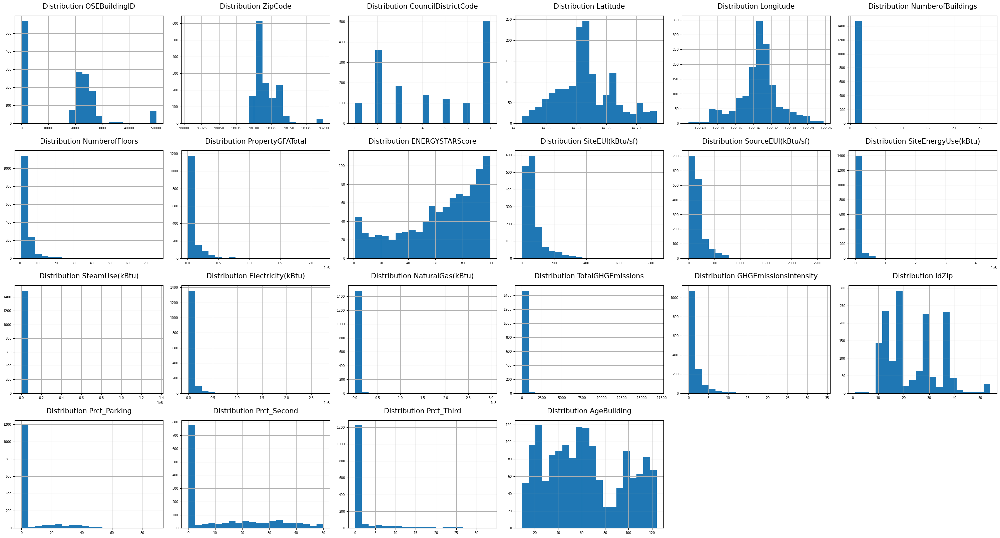

In [76]:
features=dfDataInput_filtered.select_dtypes(exclude=['object']).columns
fig = plt.figure(figsize=(30,20))
index=0
for feature in features:
    # distribution
    #print(feature[0],feature[1])
    index+=1
    ax1 = fig.add_subplot(5,6,index)
    plt.title("Distribution "+feature, fontsize=15, pad=15)
    hist = dfDataInput_filtered[feature].hist(bins=20)
    plt.tight_layout()


EUI > Energy Use Intensity<br>
GFA ><br>
WN  > Weather Normalized<br>
GHG > GreenHouse Gas (CO2)<br>

> Cible émissions totale de CO2 (TotalGHGEmissions) et consommation d'energie (SiteEUIWN)

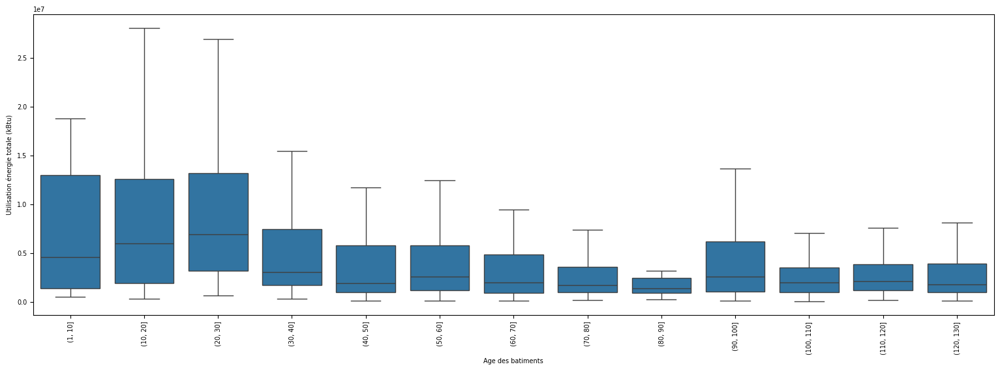

In [123]:
plt.figure(figsize=(19,6))
plt.xlabel('Age des batiments')
plt.ylabel('Utilisation énergie totale (kBtu)')
dfDataInput_filtered_box=dfDataInput_filtered
dfDataInput_filtered_box['age_bins'] = pd.cut(x=dfDataInput_filtered_box['AgeBuilding'], bins=[1,10,20,30,40,50,60,70,80,90,100,110,120,130])
ax=sns.boxplot(x="age_bins", 
            y="SiteEnergyUse(kBtu)", 
            showfliers=False,
            orient='v', 
            data=dfDataInput_filtered_box);
ax.tick_params(axis='x', rotation=90)


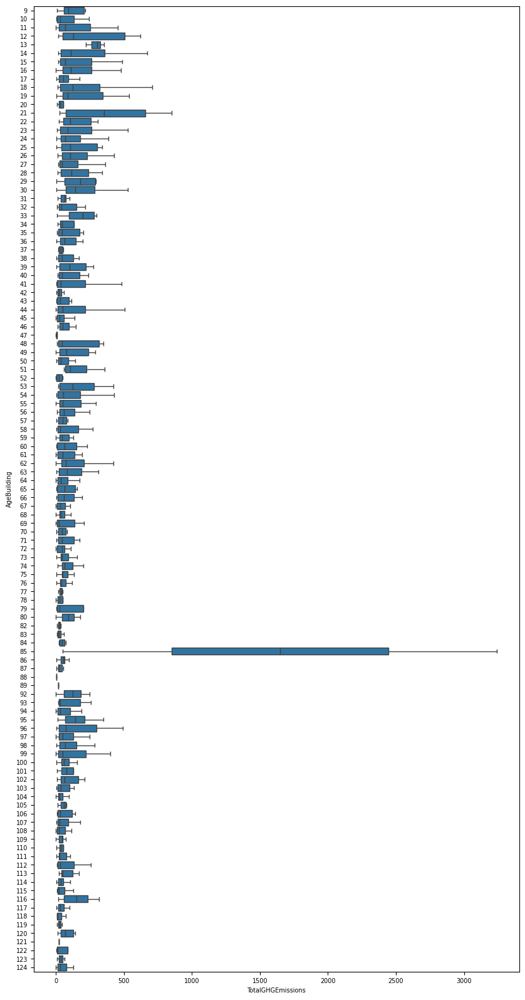

In [78]:
plt.figure(figsize=(10,20))
sns.boxplot(x="TotalGHGEmissions", 
            y="AgeBuilding", 
            showfliers=False,
            orient='h', 
            data=dfDataInput_filtered);

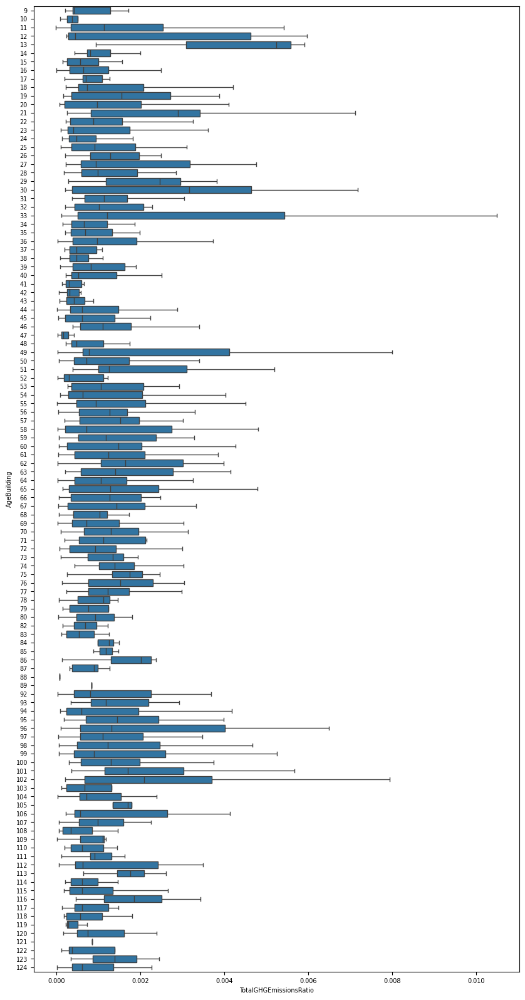

In [79]:
dfConsoAnnee = dfDataInput_filtered[['PropertyGFATotal','AgeBuilding','TotalGHGEmissions']].copy()
dfConsoAnnee['TotalGHGEmissionsRatio'] = dfConsoAnnee['TotalGHGEmissions']/dfConsoAnnee['PropertyGFATotal']
plt.figure(figsize=(10,20))
sns.boxplot(x="TotalGHGEmissionsRatio", 
            y="AgeBuilding", 
            showfliers=False,
            orient='h', 
            data=dfConsoAnnee);

In [80]:
dfSurface=dfDataInput_filtered.copy()

In [81]:
q_low = dfSurface['PropertyGFATotal'].quantile(0.01)
q_hi  = dfSurface['PropertyGFATotal'].quantile(0.99)
index2del = dfSurface[(dfSurface['PropertyGFATotal'] > q_hi) | (dfSurface['PropertyGFATotal'] < q_low)].index

print(q_low,q_hi)
print(index2del, len(np.unique(index2del)))

20047.33 1118057.870000005
Index([ 155,  158,  170,  221,  229,  233,  271,  273,  292,  477,  490,  559,
        577,  618,  780, 1027, 1030, 1494, 1581, 2192, 2246, 2530, 3361, 3362,
       3363, 3364, 3365, 3370, 3372, 3373, 3374, 3375],
      dtype='int64') 32


In [82]:
delIndividus(dfSurface,index2del)
delIndividus(dfDataInput_filtered,index2del)

------------------ Purge des individus ------------------

-- suppression de  32  indexes du DataFrame  dfSurface
------------------ Purge des individus ------------------

-- suppression de  32  indexes du DataFrame  dfDataInput_filtered


In [83]:
dfSurface.loc[dfSurface['BuildingType']=='Campus',['PropertyName','AgeBuilding','NumberofBuildings','NumberofFloors','PropertyGFATotal','Prct_Parking']]

,PropertyName,AgeBuilding,NumberofBuildings,NumberofFloors,PropertyGFATotal,Prct_Parking
35,Plant 2 Site,32,1.0,3,494835,0.00
105,SSCC MAIN CAMPUS,54,27.0,2,441071,0.00
128,NSCC MAIN CAMPUS,54,11.0,2,694072,16.08
162,South Park,44,14.0,2,334368,9.53
195,P66 Bell Harbor International Conference Cente...,29,4.0,3,215476,0.00
289,Main Market,116,1.0,4,137400,0.00
301,Securities Building Campus,111,3.0,10,258497,0.00
340,Weintraub/Hutchinson/Thomas,27,1.0,5,535947,0.00
661,Pacific Multiforms Inc- Campus,30,3.0,1,22800,0.00
954,University Prep Academy,35,5.0,3,21500,0.00


In [84]:
dfDataInput_filtered.loc[dfDataInput_filtered['AgeBuilding']==85,['PropertyName','AgeBuilding','NumberofBuildings','NumberofFloors','PropertyGFATotal','Prct_Parking']]

,PropertyName,AgeBuilding,NumberofBuildings,NumberofFloors,PropertyGFATotal,Prct_Parking
584,DOT 17G_01 1051 BUILDING,85,1.0,2,58492,0.0


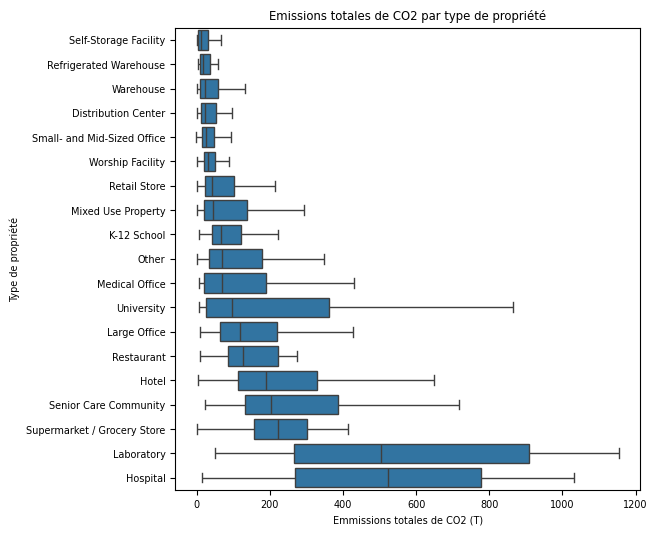

In [116]:
plt.figure(figsize=(6,6))
plt.title("Emissions totales de CO2 par type de propriété")
plt.ylabel('Type de propriété')
plt.xlabel('Emmissions totales de CO2 (T)')
ordre_type = dfDataInput_filtered.groupby('PrimaryPropertyType')['TotalGHGEmissions'].median().sort_values().index
sns.boxplot(x="TotalGHGEmissions", 
            y="PrimaryPropertyType", 
            showfliers=False,
            orient='h', 
            order=ordre_type,
            data=dfDataInput_filtered);


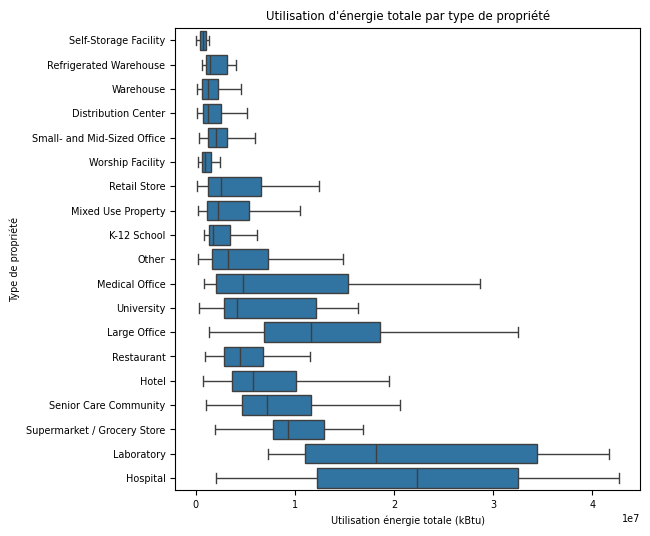

In [117]:
plt.figure(figsize=(6,6))
plt.title("Utilisation d'énergie totale par type de propriété")
plt.ylabel('Type de propriété')
plt.xlabel('Utilisation énergie totale (kBtu)')
#ordre_type = dfDataInput_filtered.groupby('PrimaryPropertyType')['SiteEnergyUse(kBtu)'].median().sort_values().index
sns.boxplot(x="SiteEnergyUse(kBtu)", 
            y="PrimaryPropertyType", 
            showfliers=False,
            orient='h', 
            order=ordre_type,
            data=dfDataInput_filtered);


Text(0.5, 1.0, 'Emissions totales de CO2 par type de batiments')

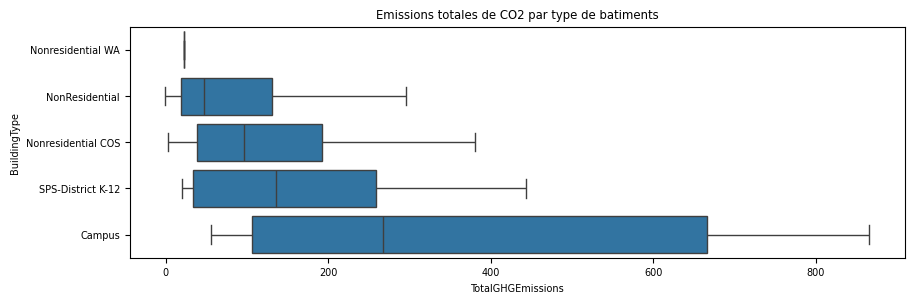

In [87]:
plt.figure(figsize=(10,3))
ordre_type = dfDataInput_filtered.groupby('BuildingType')['TotalGHGEmissions'].median().sort_values().index
sns.boxplot(x="TotalGHGEmissions", 
            y="BuildingType", 
            showfliers=False,
            orient='h', 
            order=ordre_type,
            data=dfDataInput_filtered);
plt.title("Emissions totales de CO2 par type de batiments")

Text(0.5, 1.0, 'Emissions totales de CO2 par type de batiments')

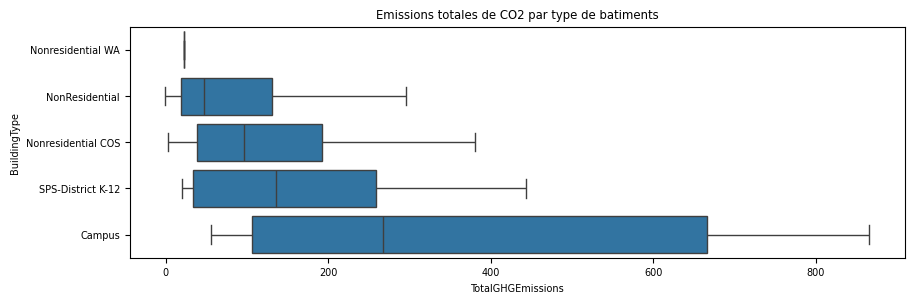

In [88]:
plt.figure(figsize=(10,3))
ordre_type = dfSurface.groupby('BuildingType')['TotalGHGEmissions'].median().sort_values().index
sns.boxplot(x="TotalGHGEmissions", 
            y="BuildingType", 
            showfliers=False,
            orient='h', 
            order=ordre_type,
            data=dfSurface);
plt.title("Emissions totales de CO2 par type de batiments")

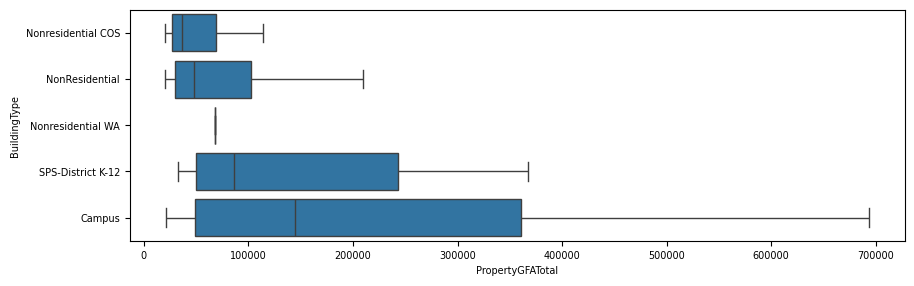

In [89]:
plt.figure(figsize=(10,3))
ordre_type = dfDataInput_filtered.groupby('BuildingType')['PropertyGFATotal'].median().sort_values().index
sns.boxplot(x="PropertyGFATotal", 
            y="BuildingType", 
            showfliers=False,
            orient='h', 
            order=ordre_type,
            data=dfDataInput_filtered);

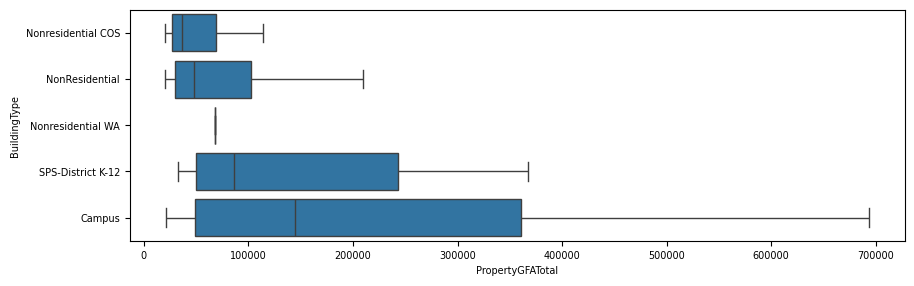

In [90]:
plt.figure(figsize=(10,3))
ordre_type = dfSurface.groupby('BuildingType')['PropertyGFATotal'].median().sort_values().index
sns.boxplot(x="PropertyGFATotal", 
            y="BuildingType", 
            showfliers=False,
            orient='h', 
            order=ordre_type,
            data=dfSurface);

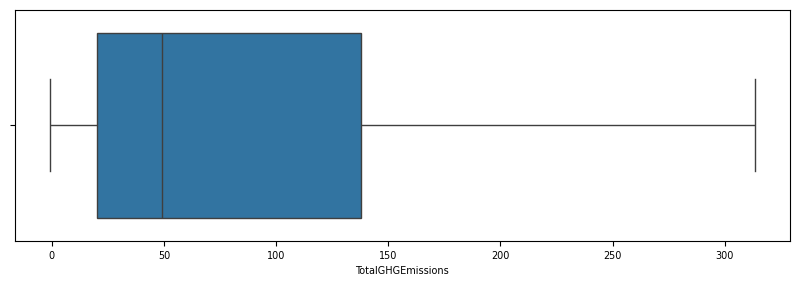

In [91]:
plt.figure(figsize=(10,3))
#ordre_type = dfSurface.groupby('BuildingType')['PropertyGFATotal'].median().sort_values().index
sns.boxplot(x="TotalGHGEmissions", 
           # y="BuildingType", 
            showfliers=False,
            orient='h', 
           # order=ordre_type,
            data=dfDataInput_filtered);

In [92]:
q_hi  = dfDataInput_filtered['TotalGHGEmissions'].quantile(0.99)
index2del = dfDataInput_filtered[(dfDataInput_filtered['TotalGHGEmissions'] > q_hi)].index

print(q_low,q_hi)
print(index2del, len(np.unique(index2del)))

20047.33 1817.4373000000048
Index([2, 35, 49, 98, 119, 124, 167, 262, 340, 558, 1672, 1690, 2325, 3156,
       3264],
      dtype='int64') 15


In [93]:
delIndividus(dfDataInput_filtered,index2del)

------------------ Purge des individus ------------------

-- suppression de  15  indexes du DataFrame  dfDataInput_filtered


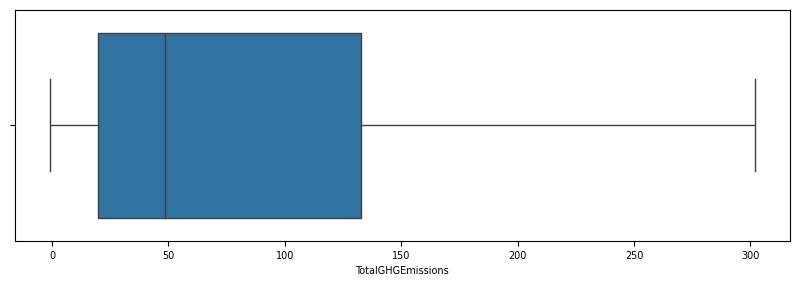

In [94]:
plt.figure(figsize=(10,3))
#ordre_type = dfSurface.groupby('BuildingType')['PropertyGFATotal'].median().sort_values().index
sns.boxplot(x="TotalGHGEmissions", 
           # y="BuildingType", 
            showfliers=False,
            orient='h', 
           # order=ordre_type,
            data=dfDataInput_filtered);

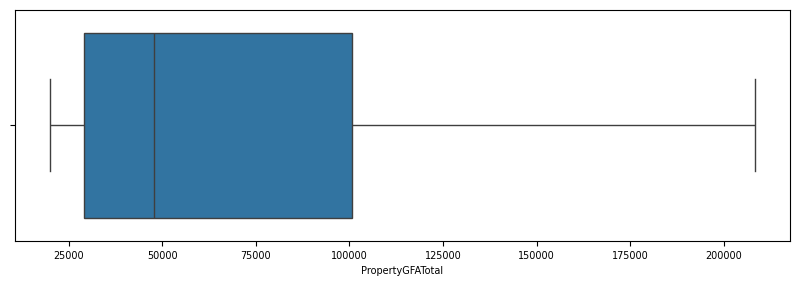

In [95]:
plt.figure(figsize=(10,3))
#ordre_type = dfSurface.groupby('BuildingType')['PropertyGFATotal'].median().sort_values().index
sns.boxplot(x="PropertyGFATotal", 
           # y="BuildingType", 
            showfliers=False,
            orient='h', 
           # order=ordre_type,
            data=dfDataInput_filtered);

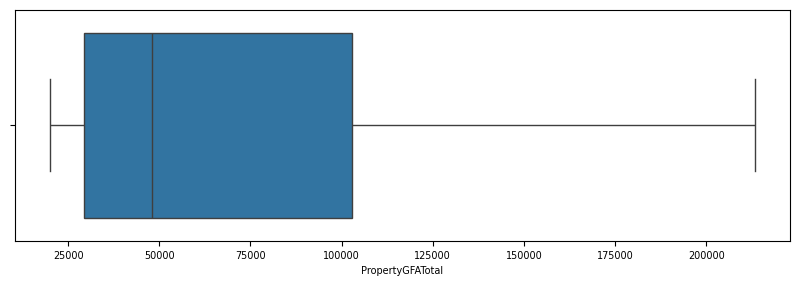

In [96]:
plt.figure(figsize=(10,3))
#ordre_type = dfSurface.groupby('BuildingType')['PropertyGFATotal'].median().sort_values().index
sns.boxplot(x="PropertyGFATotal", 
           # y="BuildingType", 
            showfliers=False,
            orient='h', 
           # order=ordre_type,
            data=dfSurface);

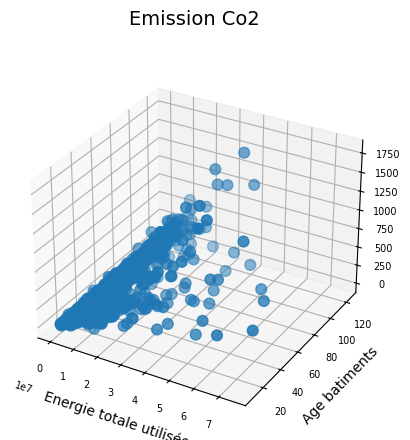

In [97]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(dfDataInput_filtered['SiteEnergyUse(kBtu)'], dfDataInput_filtered['AgeBuilding'], dfDataInput_filtered['TotalGHGEmissions'],  s=60)
#plt.zlabel('Emission totale Co2', fontsize=10)
plt.ylabel('Age batiments', fontsize=10)
plt.xlabel('Energie totale utilisée', fontsize=10)
plt.title("Emission Co2", fontsize=14, pad=25)
plt.show()


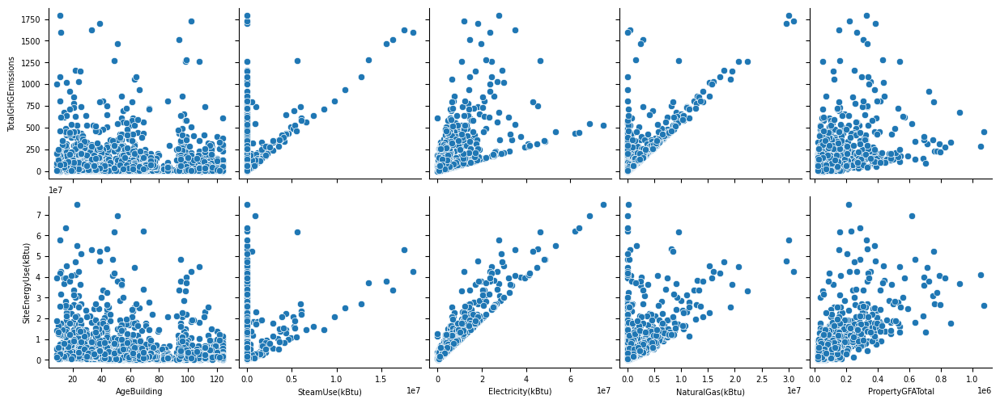

In [98]:
sns.pairplot(dfDataInput_filtered,
            x_vars=['AgeBuilding','SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)','PropertyGFATotal'],
            y_vars=['TotalGHGEmissions','SiteEnergyUse(kBtu)'],)

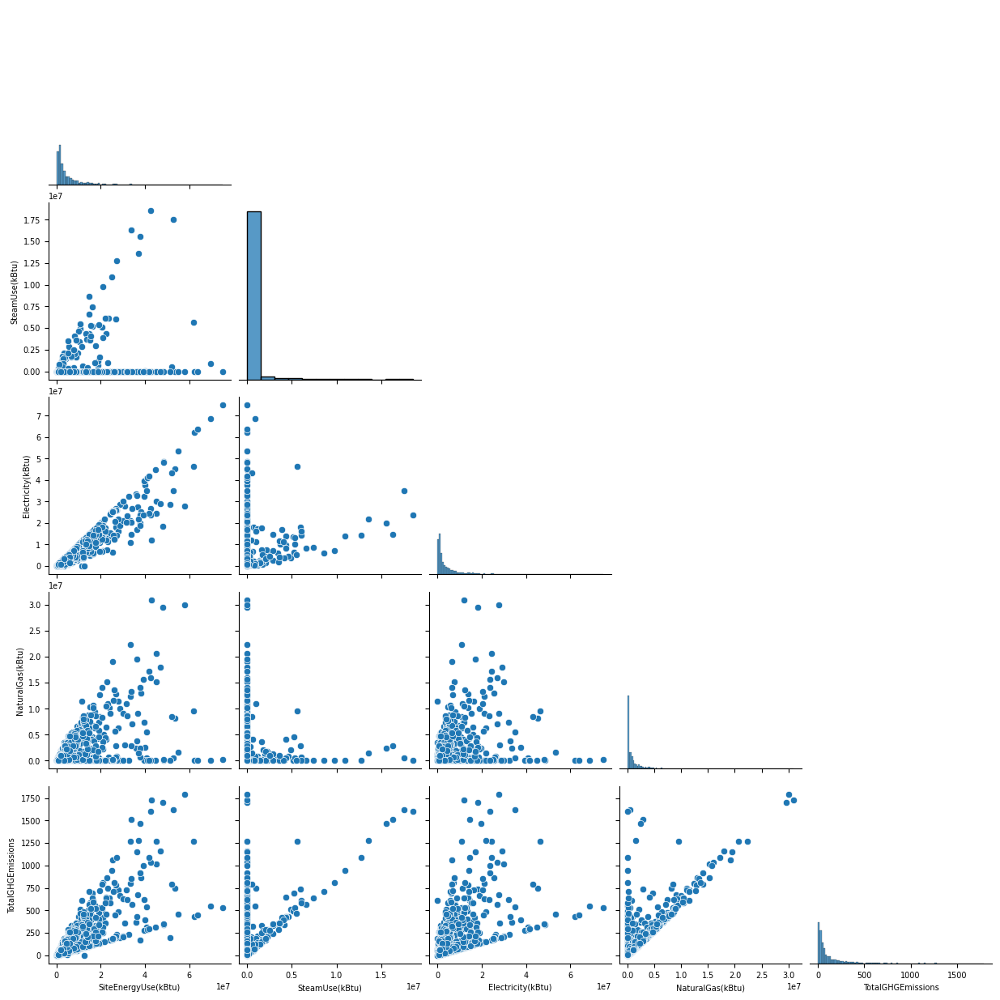

In [99]:
sns.pairplot(dfDataInput_filtered[['SiteEnergyUse(kBtu)','SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)','TotalGHGEmissions']], corner=True)

 0   OSEBuildingID                    1512 non-null   int64  
 1   BuildingType                     1512 non-null   object 
 2   PrimaryPropertyType              1512 non-null   object 
 3   PropertyName                     1512 non-null   object 
 4   Address                          1512 non-null   object 
 5   ZipCode                          1499 non-null   float64
 6   TaxParcelIdentificationNumber    1512 non-null   object 
 7   CouncilDistrictCode              1512 non-null   int64  
 8   Neighborhood                     1512 non-null   object 
 9   Latitude                         1512 non-null   float64
 10  Longitude                        1512 non-null   float64
 11  YearBuilt                        1512 non-null   int64  
 12  NumberofBuildings                1512 non-null   float64
 13  NumberofFloors                   1512 non-null   int64  
 14  PropertyGFATotal                 1512 non-null   int64  
 15  PropertyGFAParking               1512 non-null   int64  
 16  PropertyGFABuilding(s)           1512 non-null   int64  
 17  ListOfAllPropertyUseTypes        1512 non-null   object 
 18  LargestPropertyUseType           1508 non-null   object 
 19  LargestPropertyUseTypeGFA        1508 non-null   float64
 20  SecondLargestPropertyUseType     828 non-null    object 
 21  SecondLargestPropertyUseTypeGFA  828 non-null    float64
 22  ThirdLargestPropertyUseType      342 non-null    object 
 23  ThirdLargestPropertyUseTypeGFA   342 non-null    float64
 24  YearsENERGYSTARCertified         97 non-null     object 
 25  ENERGYSTARScore                  970 non-null    float64
 26  SiteEUI(kBtu/sf)                 1512 non-null   float64
 27  SiteEUIWN(kBtu/sf)               1511 non-null   float64
 28  SourceEUI(kBtu/sf)               1512 non-null   float64
 29  SourceEUIWN(kBtu/sf)             1512 non-null   float64
 30  SiteEnergyUse(kBtu)              1512 non-null   float64
 31  SiteEnergyUseWN(kBtu)            1511 non-null   float64
 32  SteamUse(kBtu)                   1512 non-null   float64
 33  Electricity(kBtu)                1512 non-null   float64
 34  NaturalGas(kBtu)                 1512 non-null   float64
 35  TotalGHGEmissions                1512 non-null   float64
 36  GHGEmissionsIntensity            1512 non-null   float64
 37  idZip                            1499 non-null   float64

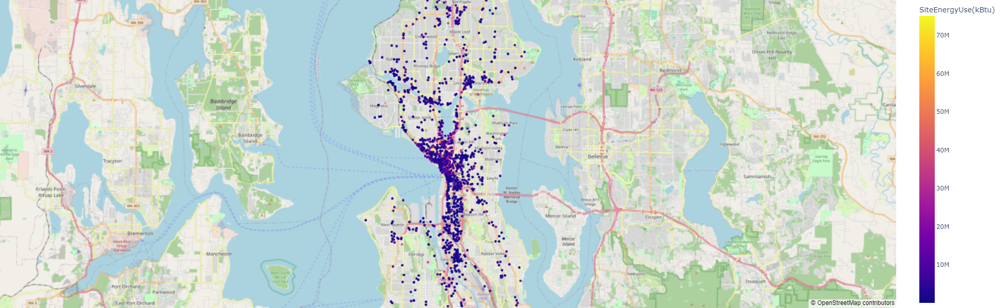

In [100]:
import plotly.express as px
fig = px.scatter_mapbox(dfDataInput_filtered, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="AgeBuilding", 
                        hover_data=["ZipCode", "Latitude", "PropertyName","Address"],
                        color="SiteEnergyUse(kBtu)",
                        #color_continuous_scale=color_scale,
                        #size=2,
                        zoom=10.5, 
                        height=600,
                        width=600)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [101]:
# Mise en attente des features que l'on ne va pas utiliser dans nos modélisations
features2move=['PropertyName', 'Address', 'TaxParcelIdentificationNumber', 'ListOfAllPropertyUseTypes', 'LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType', 'YearsENERGYSTARCertified']
dfArchives=dfDataInput_filtered[features2move]
dfDataInput_filtered.drop(columns=features2move, inplace=True)

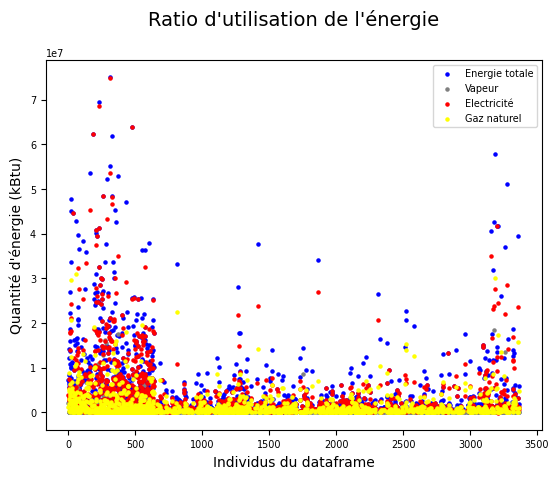

In [102]:
plt.scatter( dfDataInput_filtered.index, dfDataInput_filtered['SiteEnergyUse(kBtu)'], s=5, color="blue", label="Energie totale")
plt.scatter( dfDataInput_filtered.index, dfDataInput_filtered['SteamUse(kBtu)'], s=5, color="grey", label="Vapeur")
plt.scatter( dfDataInput_filtered.index, dfDataInput_filtered['Electricity(kBtu)'], s=5, color="red", label="Electricité")
plt.scatter( dfDataInput_filtered.index, dfDataInput_filtered['NaturalGas(kBtu)'], s=5, color="yellow", label="Gaz naturel")
plt.title("Ratio d'utilisation de l'énergie", fontsize=14, pad=25)
plt.ylabel('Quantité d\'énergie (kBtu)', fontsize=10)
plt.xlabel('Individus du dataframe', fontsize=10)
plt.legend()

Text(0.5, 0, 'Surface totale (sqf)')

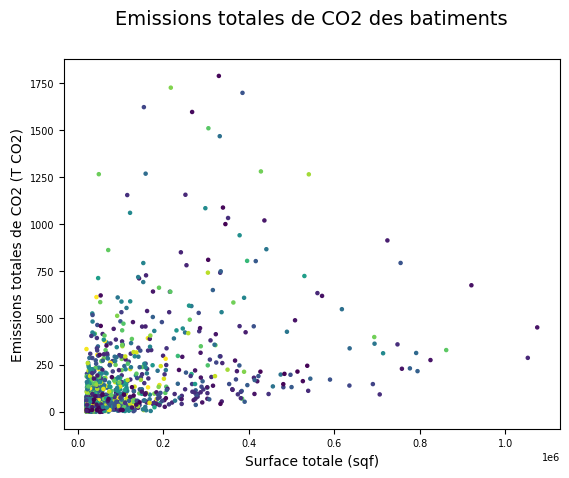

In [103]:
Cible=['Emissions totales de CO2','TotalGHGEmissions','(T CO2)']
dfPred1=pd.DataFrame()
dfPred1['Cible']=dfDataInput_filtered[Cible[1]]
dfPred1['PropertyGFATotal']=dfDataInput_filtered['PropertyGFATotal']
dfPred1['AgeBuilding']=dfDataInput_filtered['AgeBuilding']
dfPred1=dfPred1.sort_values(by=['PropertyGFATotal'])
plt.scatter(dfDataInput_filtered['PropertyGFATotal'], dfDataInput_filtered[Cible[1]],
            c=dfDataInput_filtered['AgeBuilding'], s=5)
titre=str(Cible[0])+" des batiments"
ylabel=str(Cible[0])+" "+str(Cible[2])
plt.title(titre, fontsize=14, pad=25)
plt.ylabel(ylabel, fontsize=10)
plt.xlabel('Surface totale (sqf)', fontsize=10)

### Calcul de l'énergie produite par les batiments changement des données en pourcentage pour les apports d'énergies

In [104]:
dfDataInput_filtered['NrjProd(kBtu)']=(dfDataInput_filtered['SiteEnergyUse(kBtu)']-dfDataInput_filtered['SteamUse(kBtu)']-dfDataInput_filtered['Electricity(kBtu)']-dfDataInput_filtered['NaturalGas(kBtu)'])
dfDataInput_filtered['NrjPrd(pct)']=(dfDataInput_filtered['NrjProd(kBtu)']*100)/dfDataInput_filtered['SiteEnergyUse(kBtu)']
dfDataInput_filtered['NrjElc(pct)']=(dfDataInput_filtered['Electricity(kBtu)']*100)/dfDataInput_filtered['SiteEnergyUse(kBtu)']
dfDataInput_filtered['NrjVap(pct)']=(dfDataInput_filtered['SteamUse(kBtu)']*100)/dfDataInput_filtered['SiteEnergyUse(kBtu)']
dfDataInput_filtered['NrjGaz(pct)']=(dfDataInput_filtered['NaturalGas(kBtu)']*100)/dfDataInput_filtered['SiteEnergyUse(kBtu)']

l'energie produite ne peut pas être négative on filtre ces batiments, on accèpte une erreur de l'ordre de 1kBtu dans relevés d'énergie

In [105]:
nb2limit=-1 # visualisation des batiments avec une production energetique en dessous de -1 kBtu
print("Affichage du filtre :")
pd.merge(dfDataInput_filtered, dfArchives, left_index=True, right_index=True).loc[dfDataInput_filtered['NrjProd(kBtu)']<nb2limit,['PrimaryPropertyType',
                                                                          'PropertyName',
                                                                          'SiteEnergyUse(kBtu)',
                                                                          'SteamUse(kBtu)',
                                                                          'Electricity(kBtu)',
                                                                          'NaturalGas(kBtu)',
                                                                          'NrjProd(kBtu)',
                                                                          'NrjPrd(pct)',
                                                                          'NrjElc(pct)',
                                                                          'NrjVap(pct)',
                                                                          'NrjGaz(pct)']]

Affichage du filtre :


,PrimaryPropertyType,PropertyName,SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),NrjProd(kBtu),NrjPrd(pct),NrjElc(pct),NrjVap(pct),NrjGaz(pct)
206,Large Office,1600 Seventh,40847752.0,0.0,40839637.0,538251.0,-530136.0,-1.297834,99.980134,0.0,1.317700
563,Large Office,Market Place I & II-2003 Western Avenue,5177270.5,0.0,4871126.0,1416041.0,-1109896.5,-21.437870,94.086759,0.0,27.351111
2441,Small- and Mid-Sized Office,Buttnick City Loan,2092696.0,0.0,1597575.0,991813.0,-496692.0,-23.734551,76.340520,0.0,47.394031


In [106]:
# suppression des individus selectionnés
index2del=dfDataInput_filtered.loc[dfDataInput_filtered['NrjProd(kBtu)']<nb2limit].index
delIndividus(dfDataInput_filtered,index2del)

------------------ Purge des individus ------------------

-- suppression de  3  indexes du DataFrame  dfDataInput_filtered


Batiments produisants plus de 10kBtu d'énergie :<br>
(a noter le 'Bullit Center' produit plus d'énergie qu'il n'en consomme.)

In [107]:
nb2limit=10 # visualisation des batiments avec une production energetique au dessus de 10kBtu
print("Batiments produisants plus de 10kBtu d'énergie :")
pd.merge(dfDataInput_filtered, dfArchives, left_index=True, right_index=True).loc[dfDataInput_filtered['NrjProd(kBtu)']>nb2limit,['PrimaryPropertyType',
                                                                          'PropertyName',
                                                                          'SiteEnergyUse(kBtu)',
                                                                          'TotalGHGEmissions',
                                                                          'SteamUse(kBtu)',
                                                                          'Electricity(kBtu)',
                                                                          'NaturalGas(kBtu)',
                                                                          'NrjProd(kBtu)',
                                                                          'NrjPrd(pct)',
                                                                          'NrjElc(pct)',
                                                                          'NrjVap(pct)',
                                                                          'NrjGaz(pct)']]


Batiments produisants plus de 10kBtu d'énergie :


,PrimaryPropertyType,PropertyName,SiteEnergyUse(kBtu),TotalGHGEmissions,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),NrjProd(kBtu),NrjPrd(pct),NrjElc(pct),NrjVap(pct),NrjGaz(pct)
69,Other,Key Arena,2.365898e+07,607.41,6093150.0,14419146.0,688680.0,2.458002e+06,10.389299,60.945769,25.754071,2.910861
70,Other,Bagley Wright Theatre,8.141156e+06,344.20,4120130.0,3754115.0,0.0,2.669105e+05,3.278533,46.112803,50.608664,0.000000
71,Other,Armory,2.095503e+07,804.20,9763690.0,7252325.0,0.0,3.939011e+06,18.797452,34.609000,46.593548,0.000000
73,Other,Exhibition Hall,2.726369e+06,101.83,1202380.0,1293349.0,0.0,2.306400e+05,8.459603,47.438516,44.101881,0.000000
75,Other,McCaw Hall,2.072325e+07,490.73,5137220.0,13512686.0,0.0,2.073342e+06,10.004908,65.205445,24.789647,0.000000
309,Mixed Use Property,Fisher Plaza - West Building,7.507389e+07,530.59,0.0,74917352.0,156525.0,1.100000e+01,0.000015,99.791491,0.000000,0.208495
329,Other,VM Seattle Hospital & Medical Center - Buck Pa...,6.176238e+07,1268.87,5650343.5,46528618.0,9571816.0,1.160250e+04,0.018786,75.334885,9.148520,15.497810
371,Large Office,Adobe Seattle,1.132551e+07,94.47,0.0,10986553.0,336610.0,2.350000e+03,0.020750,97.007111,0.000000,2.972139
403,Large Office,Alley24,9.058916e+06,54.92,0.0,7877393.0,0.0,1.181523e+06,13.042653,86.957347,0.000000,0.000000
513,Supermarket / Grocery Store,IUC- Whole Foods Interbay,1.252517e+07,0.00,0.0,0.0,0.0,1.252517e+07,100.000000,0.000000,0.000000,0.000000


In [108]:
# suppression des individus selectionnés
#index2del=dfDataInput_filtered.loc[dfDataInput_filtered['NrjProd(kBtu)']>nb2limit].index
#delIndividus(dfDataInput_filtered,index2del)

In [109]:
nb2limit=1400 # visualisation des batiments avec une production de C02 au dessus de 1400 
pd.merge(dfDataInput_filtered, dfArchives, left_index=True, right_index=True).loc[dfDataInput_filtered['TotalGHGEmissions']>nb2limit,['PrimaryPropertyType',
                                                                          'PropertyName',
                                                                          'SiteEnergyUse(kBtu)',
                                                                          'SiteEUI(kBtu/sf)',
                                                                          'AgeBuilding',
                                                                          'NrjProd(kBtu)',
                                                                          'NrjPrd(pct)',
                                                                          'NrjElc(pct)',
                                                                          'NrjVap(pct)',
                                                                          'NrjGaz(pct)']]

,PrimaryPropertyType,PropertyName,SiteEnergyUse(kBtu),SiteEUI(kBtu/sf),AgeBuilding,NrjProd(kBtu),NrjPrd(pct),NrjElc(pct),NrjVap(pct),NrjGaz(pct)
21,Other,King County Correctional Facility,47859812.0,124.199997,39,1.0,0.000002,38.148209,0.000000,61.851789
59,Senior Care Community,PSSA - The Mount,42792072.0,144.399994,102,0.0,0.000000,27.633091,0.000000,72.366909
272,Hotel,WAC aggregate,33729336.0,108.800003,94,3.0,0.000009,43.220709,48.280138,8.499144
280,Hotel,Motif Seattle,37785552.0,113.800003,51,1.0,0.000003,52.402416,41.248607,6.348974
373,Mixed Use Property,Seattle Art Museum,52960796.0,209.300003,33,8.0,0.000015,65.967309,33.134729,0.897947
3182,Other,VM Seattle Hospital & Medical Center - Jones P...,42584028.0,159.199997,12,240259.0,0.564200,55.879897,43.555903,0.000000
3187,Hospital,Seattle Children's Hospital Building Hope,57764408.0,239.199997,11,2.0,0.000003,47.958738,0.000000,52.041259


In [110]:
# suppression des individus selectionnés
index2del=dfDataInput_filtered.loc[dfDataInput_filtered['TotalGHGEmissions']>nb2limit].index
delIndividus(dfDataInput_filtered,index2del)

------------------ Purge des individus ------------------

-- suppression de  7  indexes du DataFrame  dfDataInput_filtered


In [111]:
nb2limit=400 # visualisation des batiments avec une conso energetique au dessus de 400 kBtu/sf
pd.merge(dfDataInput_filtered, dfArchives, left_index=True, right_index=True).loc[dfDataInput_filtered['SiteEUI(kBtu/sf)']>nb2limit,['PrimaryPropertyType',
                                                                          'PropertyName',
                                                                          'SiteEnergyUse(kBtu)',
                                                                          'SiteEUI(kBtu/sf)',
                                                                          'AgeBuilding',
                                                                          'NrjProd(kBtu)',
                                                                          'NrjPrd(pct)',
                                                                          'NrjElc(pct)',
                                                                          'NrjVap(pct)',
                                                                          'NrjGaz(pct)']]

,PrimaryPropertyType,PropertyName,SiteEnergyUse(kBtu),SiteEUI(kBtu/sf),AgeBuilding,NrjProd(kBtu),NrjPrd(pct),NrjElc(pct),NrjVap(pct),NrjGaz(pct)
240,Other,UW Tower Data Center,30038490.0,834.400024,55,3.0,0.000010,99.999990,0.0,0.000000
309,Mixed Use Property,Fisher Plaza - West Building,75073888.0,707.299988,23,11.0,0.000015,99.791491,0.0,0.208495
601,Small- and Mid-Sized Office,200 SW Michigan,37951708.0,465.500000,95,18656521.0,49.158581,49.036146,0.0,1.805273
809,Laboratory,3000/3018 Western,33268410.0,696.700012,98,0.0,0.000000,32.627796,0.0,67.372204
1817,Restaurant,Salty's Waterfront Seafood Grill,9313513.0,456.600006,122,0.0,0.000000,37.349537,0.0,62.650463
2109,Supermarket / Grocery Store,Metropolitan Market,9851260.0,404.100006,51,0.0,0.000000,57.836185,0.0,42.163815
2795,Supermarket / Grocery Store,Admiral,13140574.0,412.700012,27,0.0,0.000000,48.440159,0.0,51.559841
3171,Other,"Seattle ProCure Management, LLC.",31803568.0,593.599976,12,2.0,0.000006,72.864394,0.0,27.135600
3203,Other,2020 Fifth Avenue Dat Center,41680640.0,694.700012,49,6.0,0.000014,99.999986,0.0,0.000000


In [112]:
# suppression des individus selectionnés
index2del=dfDataInput_filtered.loc[dfDataInput_filtered['SiteEUI(kBtu/sf)']>nb2limit].index
delIndividus(dfDataInput_filtered,index2del)

------------------ Purge des individus ------------------

-- suppression de  9  indexes du DataFrame  dfDataInput_filtered


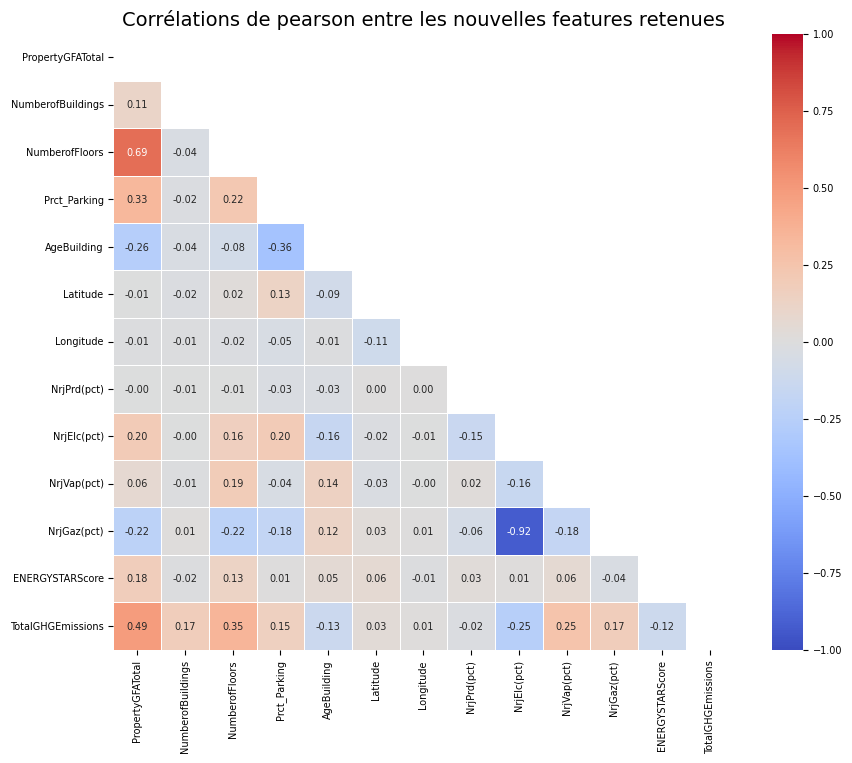

In [113]:
correlation_features=['PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors', 'Prct_Parking',
                     'AgeBuilding','Latitude','Longitude','NrjPrd(pct)', 'NrjElc(pct)',
                     'NrjVap(pct)', 'NrjGaz(pct)','ENERGYSTARScore','TotalGHGEmissions']
correlation_features = dfDataInput_filtered[correlation_features].corr()

plt.figure(figsize = (10,8))
plt.title("Corrélations de pearson entre les nouvelles features retenues", fontsize=14)
plt.rcParams.update({'font.size': 7})
mask = np.triu(np.ones_like(correlation_features, dtype=bool))
graph=sns.heatmap(correlation_features, vmin=-1, vmax=1, cmap ='coolwarm', linewidths = 0.5, annot = True, fmt=".2f", mask = mask) 

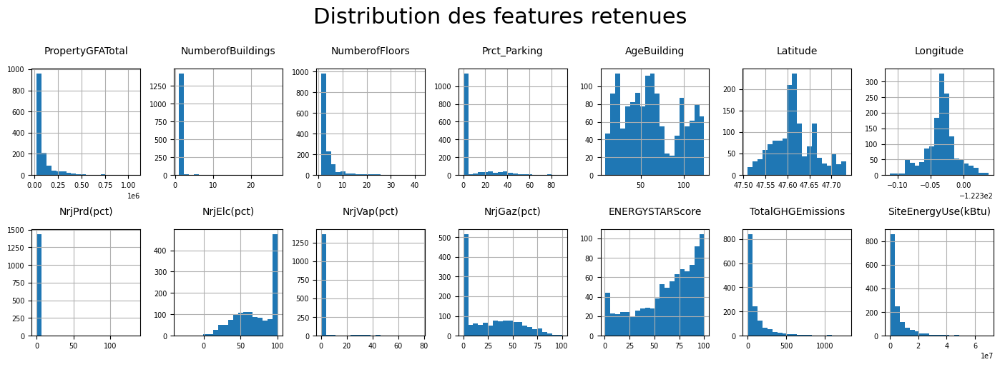

In [114]:
features=['PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors', 'Prct_Parking',
                     'AgeBuilding','Latitude','Longitude','NrjPrd(pct)', 'NrjElc(pct)',
                     'NrjVap(pct)', 'NrjGaz(pct)','ENERGYSTARScore','TotalGHGEmissions','SiteEnergyUse(kBtu)']
fig = plt.figure(figsize=(14,5))
fig.suptitle('Distribution des features retenues', size=22, y=1.01)
index=0
for feature in features:
    # distribution
    #print(feature[0],feature[1])
    index+=1
    ax1 = fig.add_subplot(2,7,index)
    plt.title(""+feature, fontsize=10, pad=15)
    hist = dfDataInput_filtered[feature].hist(bins=20)
    plt.tight_layout()


## Sauvegarde des DataFrames

In [115]:
# Sauvegarde des Df
dfDataInput.to_csv(dossierExport+'Data_input.csv', index=False, sep='|', lineterminator='\n', encoding='utf-8')
dfDataInput_filtered.to_csv(dossierExport+'Data_cleared.csv', index=False, sep='|', lineterminator='\n', encoding='utf-8')
